
<h1><center> Importing packages </center></h1>

In [1]:
# !conda info --envs

In [2]:
from astropy.io import fits
import astropy.units as u
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import glob
import matplotlib.pyplot as plt
plt.style.use('seaborn-dark')
# from marvin.tools.image import Image
import matplotlib.image as mpimg
# import matplotlib

from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)

In [3]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/*.csv")
# bbrd_morph_df = pd.read_csv('/Users/mmckay/Desktop/research/FMR_MZR/final_galzoo_MaNGAbbrd_crossmatch.csv')


In [4]:
hdu = fits.open("/Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/10001-3702_MM.fits")
hdu.info()

Filename: /Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/10001-3702_MM.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  HALPHA        1 PrimaryHDU      14   (44, 44)   float32   
  1  HALPHA KCORR    2 ImageHDU         9   (44, 44)   float32   
  2  HBETA KCORR    3 ImageHDU         9   (44, 44)   float32   
  3  NII6585 KCORR    4 ImageHDU         9   (44, 44)   float32   
  4  OII3727 KCORR    5 ImageHDU         9   (44, 44)   float32   
  5  OII3729 KCORR    6 ImageHDU         9   (44, 44)   float32   
  6  OIII5008 KCORR    7 ImageHDU         9   (44, 44)   float32   
  7  SII6718 KCORR    8 ImageHDU         9   (44, 44)   float32   
  8  SII6732 KCORR    9 ImageHDU         9   (44, 44)   float32   
  9  HALPHA SNR   10 ImageHDU         9   (44, 44)   float32   
 10  HBETA SNR    11 ImageHDU         9   (44, 44)   float32   
 11  NII6585 SNR   12 ImageHDU         9   (44, 44)   float32   
 12  OII3727 SNR   13 ImageHDU         9   (44, 44) 

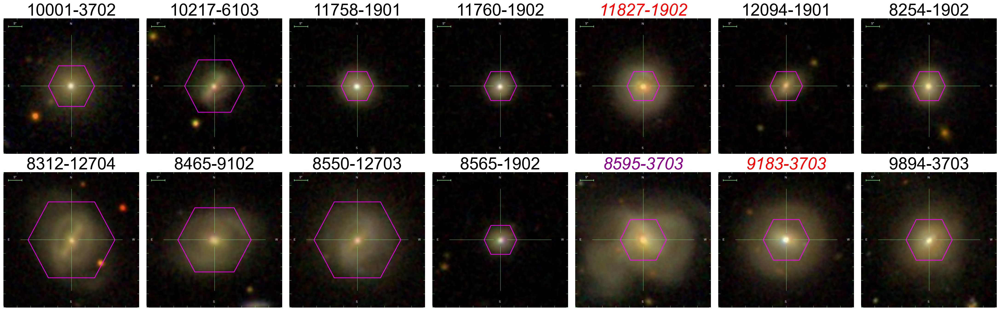

In [6]:
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
# bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=False, dpi=150)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    hdu.close()
    imfn = '/Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_sdss_images/{}.png'.format(plateifu)
    #imfn = im.filename
    #print(imfn)
    img = mpimg.imread(imfn)



    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    imgplot = ax.imshow(img, aspect=1, label='{}'.format(plateifu))
    # ax.set_title('{}'.format(plateifu), fontsize=35)
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
    # ax.legend()
    # plt.xticks(fontsize=15)
    # plt.yticks(fontsize=15)
    if plateifu in ['11827-1902', '9183-3703']:
        ax.set_title('{}'.format(plateifu), fontsize=35, color='red', style='italic')
    elif plateifu in ['8595-3703']:
        ax.set_title('{}'.format(plateifu), fontsize=35, color='darkmagenta', style='italic')
    else:
        ax.set_title('{}'.format(plateifu), fontsize=35, color='black')



# plt.suptitle('SDSS Color Images', fontsize=40)  
plt.tight_layout(h_pad=2.5, w_pad=-5.0)
plt.savefig("/Users/mmckay/Desktop/research/BreakBRD_LG12_analysis_repo/BBRD_maps/bbrd_sdssimgs.jpeg") # not displaying colorbar
plt.savefig("/Users/mmckay/Desktop/research/BreakBRD_LG12_analysis_repo/BBRD_maps/bbrd_sdssimgs.pdf") # not displaying colorbar
plt.show()

<h1><center> Gas & Stellar Velocity data analysis </center></h1>

1 /Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/10001-3702_MM.fits
2 /Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/10217-6103_MM.fits
3 /Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/11758-1901_MM.fits
4 /Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/11760-1902_MM.fits
5 /Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/11827-1902_MM.fits
6 /Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/12094-1901_MM.fits
7 /Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/8254-1902_MM.fits
8 /Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/8312-12704_MM.fits
9 /Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/8465-9102_MM.fits
10 /Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/8550-12703_MM.fits
11 /Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/8565-1902_MM.fits
12 /Users/mmckay/Desktop/research/MM_manga_m

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:41: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.




14 /Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/9894-3703_MM.fits


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:41: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




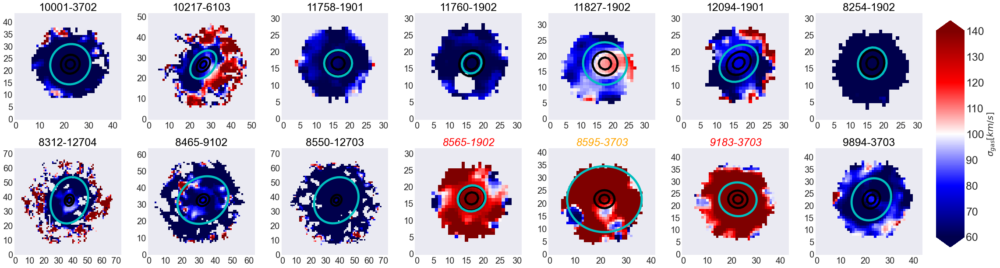

In [22]:
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
    hdu = fits.open(bbrd_fits)
    print(int(num), bbrd_fits)
    ifu_map = hdu['GASVEL_DISP'].data
    ifu_map[ifu_map == 0] = np.nan
    r_reff_map = hdu['R/Reff'].data
    ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']
    hdu.close()
    ax = fig.add_subplot(2,7,int(num))
    im = ax.imshow(ifu_map, vmin=60, vmax=140, origin='lower', cmap='seismic')

    ellip_r_contour = ax.contour(ellip_r_map, levels = np.arange(1, 3, 1), origin='lower', colors='k',
    linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.arange(1, 2, 1), origin='lower', colors='c',
    linewidths=5)
    #ax.clabel(r_reff_contour, fontsize=9, inline=1)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    ax.legend(["Reff={}".format(reff)])
    if plateifu in ['9183-3703', '8565-1902']:
        ax.set_title('{}'.format(plateifu), fontsize=25, color='red', style='italic')
    elif plateifu in ['8595-3703']:
        ax.set_title('{}'.format(plateifu), fontsize=25, color='orange', style='italic')
    else:
        ax.set_title('{}'.format(plateifu), fontsize=25, color='black')
    


cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical', extend='both')
cbar.ax.tick_params(labelsize=25)
cbar.set_label(label='$\sigma_{gas}[km/s]$', size='large', fontsize=20)
plt.tight_layout(pad=3)
plt.savefig("/Users/mmckay/Desktop/research/BreakBRD_LG12_analysis_repo/BBRD_maps/bbrd_havdisp_maps.jpeg", bbox_inches='tight') # not displaying colorbar
plt.show()

<h1><center> D4000 index data analysis </center></h1>

In [7]:
# # Test one D4000 file 
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# hdu = fits.open(bbrd_fits_file_list[0])


# fig = px.imshow(hdu['GYR_LW'].data, zmin=None, zmax=None, origin='lower', color_continuous_scale='rdbu_r', labels={'color':'D4000 Index'})
# fig.add_trace(go.Contour(z=hdu['R/REFF'].data, showscale=False, line=dict(width=10),
#                         contours=dict(start=1, end=1, size=1, coloring='lines', showlabels=True,
#                             labelfont = dict(size=30, color='black'
#                             ),
#                         ),
#                         line_width=2, name='R/REFF'))
# fig.add_trace(go.Contour(z=hdu['ELLIP R'].data, showscale=False, line=dict(width=10),
#                         contours=dict(start=1, end=3, size=2, coloring='lines', showlabels=True,
#                             labelfont = dict(size=20, color='white'
#                             ),
#                         ),
#                         line_width=2, name='ELLIP R'))

# fig.update_layout(width=1000, height=1000)
# fig.show()
# hdu.info()
# hdu.close()



[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:44: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:44: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




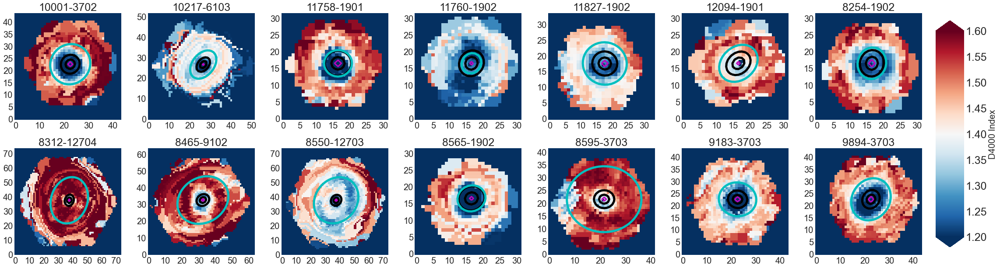

In [8]:
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9),constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits)
    D4000_map = hdu['D4000'].data
    r_reff_map = hdu['R/Reff'].data
    ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']
    nsa_z = float(hdu[0].header['z'].split()[0])
    hdu.close()

    # Caculate angular diamenter distance of an HII region (30 ly diameter - 0.00919804kpc) or NGC 604 (830 ly - 0.254479 kpc) or GMC (600 ly - 0.183961 kpc)
    angle_diameter_distance = cosmo.kpc_proper_per_arcmin(nsa_z).to(u.kpc/u.arcsec) #kpc/arcsec
    h2_region_diamerter_dist = (angle_diameter_distance / (0.254479*u.kpc))**-1 # arcsec
    #h2_region_diamerter_dist = (angle_diameter_distance / (8*u.kpc))**-1 # arcsec # galactocentric distance

    ax = fig.add_subplot(2,7,int(num))
    im = ax.imshow(D4000_map, vmin=1.2, vmax=1.6, origin='lower', cmap='RdBu_r')

    ellip_r_contour = ax.contour(ellip_r_map, levels = np.arange(1, 3, 1), origin='lower', colors='k', linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.arange(1, 2, 1), origin='lower', colors='c',
    linewidths=5)
    h2_region_approx_rad = ax.contour(ellip_r_map, levels = np.linspace(0, h2_region_diamerter_dist.value, 2), origin='lower', colors='m',
    linewidths=3)
    #ax.clabel(r_reff_contour, fontsize=9, inline=1)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    ax.legend(["Reff={}".format(reff)])
    hdu.close()
    


cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical',extend='both')
cbar.ax.tick_params(labelsize=25)
cbar.set_label(label='D4000 Index', size='large', fontsize=20)
plt.tight_layout(pad=3)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_d4000_mosaic.jpeg", bbox_inches='tight') # not displaying colorbar
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:34: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:34: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




FileNotFoundError: [Errno 2] No such file or directory: '/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_dap_d4000_mosaic.jpeg'

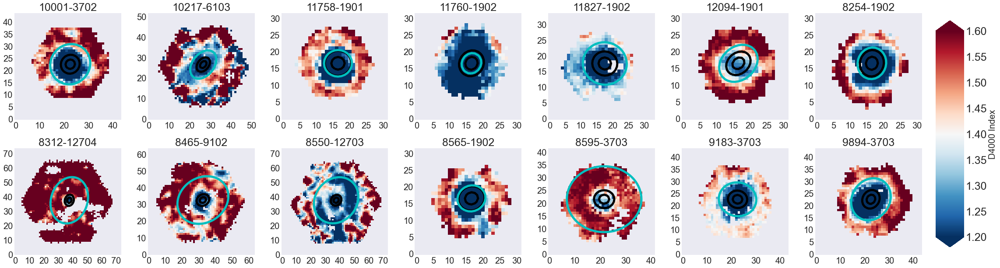

In [23]:
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9),constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits)
    dap_D4000_map = hdu['DAP_D4000'].data
    r_reff_map = hdu['R/Reff'].data
    ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']
    hdu.close()
    ax = fig.add_subplot(2,7,int(num))
    im = ax.imshow(dap_D4000_map, vmin=1.2, vmax=1.6, origin='lower', cmap='RdBu_r')
    ellip_r_contour = ax.contour(ellip_r_map, levels = np.arange(1, 3, 1), origin='lower', colors='k',
    linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.arange(1, 2, 1), origin='lower', colors='c',
    linewidths=5)
    #ax.clabel(r_reff_contour, fontsize=9, inline=1)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    ax.legend(["Reff={}".format(reff)])
    


cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical',extend='both')
cbar.ax.tick_params(labelsize=25)
cbar.set_label(label='D4000 Index', size='large', fontsize=20)
plt.tight_layout(pad=3)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_dap_d4000_mosaic.jpeg", bbox_inches='tight') # not displaying colorbar
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:44: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:44: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




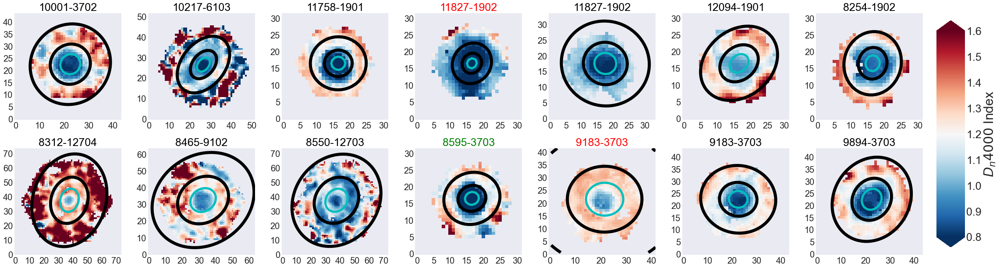

In [15]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/MM_manga_maps_FITS_CSV/bbrd_MMfits/*.fits")
save_path = '/Users/mmckay/Desktop/research/BreakBRD_LG12_analysis_repo/BBRD_maps/'
# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9),constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits)
    dap_D4000_map = hdu['DAP_DN4000'].data
    r_reff_map = hdu['R/Reff'].data
    ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    if plateifu == '9183-3703' or plateifu == '11827-1902':
        ax.set_title('{}'.format(plateifu), fontsize=25, color='red')
    elif plateifu == '8595-3703':
        ax.set_title('{}'.format(plateifu), fontsize=25, color='green')


    reff = hdu[0].header['REFF']
    hdu.close()
    ax = fig.add_subplot(2,7,int(num))
    im = ax.imshow(dap_D4000_map, vmin=0.8, vmax=1.6, origin='lower', cmap='RdBu_r')
    # Contours
    # ellip_r_contour = ax.contour(ellip_r_map, levels = np.arange(1, 3, 1), origin='lower', colors='k',
    # linewidths=5)
    # ellip_r_contour = ax.contour(ellip_r_map, levels = np.linspace(3, 3, 1), origin='lower', colors='white', linewidths=7)
    # r_reff_contour = ax.contour(r_reff_map, levels = np.linspace(0.5, 2.0, 4), origin='lower', colors='k', linewidths=3)
    r_reff_contour = ax.contour(r_reff_map, levels = np.linspace(2.0, 2.0, 1), origin='lower', colors='k', linewidths=7)
    r_reff_contour = ax.contour(r_reff_map, levels = np.linspace(0.5, 0.5, 1), origin='lower', colors='c', linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.linspace(1, 1, 1), origin='lower', colors='k', linewidths=7)
    #ax.clabel(r_reff_contour, fontsize=9, inline=1)
    ax.set_title('{}'.format(plateifu), fontsize=25, color='black')
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    ax.legend(["Reff={}".format(reff)])
    


cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical',extend='both')
cbar.ax.tick_params(labelsize=25)
cbar.set_label(label=r'$D_{n}4000$ Index', size='large', fontsize=30)
plt.tight_layout(pad=3)
plt.savefig("{}bbrd_dap_dn4000_mosaic.jpeg".format(save_path), bbox_inches='tight') # not displaying colorbar
plt.savefig("{}bbrd_dap_dn4000_mosaic.pdf".format(save_path), bbox_inches='tight')
plt.show()

In [11]:
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
# bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# # Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
# fig = plt.figure(figsize=(30,9), constrained_layout=True)

# #axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
# for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
#     # Read in FITS data
#     hdu = fits.open(bbrd_fits)
#     #print(int(num), bbrd_fits, bbrd_csv)
#     # ageL_map = hdu['GYR_LW'].data
#     # ageL_err_map = hdu['GYR_ERR'].data
#     # r_reff_map = hdu['R/Reff'].data
#     # # ellip_r_map = hdu['ELLIP R'].data
#     plateifu = hdu[0].header['plateifu']
#     reff = hdu[0].header['REFF']

#     # Read in CSV data
#     df = pd.read_csv(bbrd_csv)
#     xdata = df['R/REFF']
#     ydata = df['DAP_D4000'] * df['DAP_D4000_CORR']
#     ydata1 = df['DAP_D4000']
#     #yerr = 
#     yerr = np.sqrt(1 / (df['DAP_D4000_IVAR']))

#     # split data in radial bins and 
#     bins = np.linspace(0, 5, 16)
#     digitized = np.digitize(xdata, bins)

#     # Calulates the median of each bin
#     bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
#     agel_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
#     agel_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
#     agel_err_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

#     # set xaxis for bin medians
#     x = bins[:len(bin_meds)] + .2 # adjust for display offset


#     # Plotting
#     ax = fig.add_subplot(2,7,int(num))
#     ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='red')
#     #ax.scatter(xdata, ydata1, s=6, marker='x', alpha=0.5, color='blue')
#     ax.scatter(x, agel_bin_meds, alpha=1.0, color='black')
#     #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
#     #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
#     ax.errorbar(x, agel_bin_meds, yerr=agel_err_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)
#     ax.set_ylim(0.5, 2.5)
#     ax.set_xlim(0, 3)
#     ax.set_xlabel('R/Reff', fontsize=15)
#     ax.set_ylabel('$D4000 Index$', fontsize=15)
#     ax.set_title('{}'.format(plateifu), fontsize=25)
#     plt.xticks(fontsize=15)
#     plt.yticks(fontsize=15)
#     ax.legend(["Reff={}".format(reff)])
#     ax.axhline(1.4, color='black')
#     hdu.close()

# plt.suptitle('DAP D4000 Index Radial Profile', fontsize=40)  
# plt.tight_layout(pad=2)
# plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_dap_d4000_radpro.jpeg") # not displaying colorbar
# plt.show(

In [12]:
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
# bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# # Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
# fig = plt.figure(figsize=(7,15), constrained_layout=True, dpi=150)

# #axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
# for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
#     # Read in FITS data
#     hdu = fits.open(bbrd_fits)
#     #print(int(num), bbrd_fits, bbrd_csv)
#     # ageL = hdu['GYR_LW'].data
#     # ageL_err_map = hdu['GYR_ERR'].data
#     # r_reff_map = hdu['R/Reff'].data
#     # # ellip_r_map = hdu['ELLIP R'].data
#     plateifu = hdu[0].header['plateifu']
#     reff = hdu[0].header['REFF']

#     # Read in CSV data
#     df = pd.read_csv(bbrd_csv)
#     r_reff = df['R/REFF']
#     dap_D4000 = df['DAP_D4000'] * df['DAP_D4000_CORR']
#     dap_Dn4000 = df['DAP_DN4000'] * df['DAP_DN4000_CORR']
#     p3d_D4000 = df['D4000']
#     dap_D4000err = df['D4000_ERR']

#     # split data in radial bins and 
#     bins = np.linspace(0, 5, 16)
#     digitized = np.digitize(r_reff, bins)

#     # Calulates the median of each bin
#     r_reff_medbins = [r_reff[digitized == i].median() for i in range(1, len(bins))]
#     dap_d4000_medbins = [dap_D4000[digitized == i].median() for i in range(1, len(bins))]
#     dap_d4000err_medbins = [dap_D4000err[digitized == i].median() for i in range(1, len(bins))]
#     dap_Dn4000_medbins = [dap_Dn4000[digitized == i].median() for i in range(1, len(bins))]
#     p3d_D4000_medbins = [p3d_D4000[digitized == i].median() for i in range(1, len(bins))]


#     # Plotting
#     ax = fig.add_subplot(7,2,int(num))
#     # ax.scatter(r_reff, dap_D4000, s=6, marker='x', alpha=0.5, color='red')
#     # ax.scatter(r_reff, dap_Dn4000, alpha=1.0, color='black')
#     #ax.plot(x, dap_d4000_medbins, alpha=1.0, color='black')
#     #ax.errorbar(x, dap_d4000_medbins, dap_D4000err=1/(np.array(dap_d4000_stdbins)**2), color='cyan')
#     # ax.errorbar(r_reff_medbins, dap_d4000_medbins, yerr=dap_d4000err_medbins, color='black', linestyle='--', capsize=3, linewidth=3.0, label='DAP D4000 index')
#     ax.plot(r_reff_medbins, dap_d4000_medbins, alpha=0.5, color='black', linestyle='--', label='DAP D4000 index')
#     ax.plot(r_reff_medbins, dap_Dn4000_medbins, alpha=0.5, color='red', linestyle='--', label='DAP Dn4000 index')
#     ax.plot(r_reff_medbins, p3d_D4000_medbins, alpha=0.5, color='green', linestyle='--', label='Pipe3D D4000 index')
#     ax.set_ylim(0.5, 2.5)
#     ax.set_xlim(0, 3)
#     ax.set_xlabel('R/Reff', fontsize=15)
#     ax.set_ylabel('$D4000 Index$', fontsize=15)
#     ax.set_title('{}'.format(plateifu), fontsize=25)
#     plt.xticks(fontsize=15)
#     plt.yticks(fontsize=15)
#     #ax.legend(["Reff={}".format(reff)])
#     #ax.legend()
#     ax.axhline(1.4, color='black', alpha=.1)
#     hdu.close()

# #plt.suptitle('D4000 Index Radial Profile', fontsize=40)
# plt.legend() 
# plt.tight_layout(pad=2)
# plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_d4000combo_radpro.pdf")
# plt.show()

In [13]:
# # Age median radial profile seperated by morphology
# # All radial profiles
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
# bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# # Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
# #fig = plt.figure(figsize=(8,6), constrained_layout=True)
# fig, (ax0,ax1,ax2) = plt.subplots(1,3, figsize=(15,5), constrained_layout=True, sharex=True, sharey=True)


# for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
#     # Read in FITS data
#     hdu = fits.open(bbrd_fits)
#     df = pd.read_csv(bbrd_csv)
#     xdata = df['R/REFF']
#     ydata = df['DAP_DN4000'] * df['DAP_DN4000_CORR']
#     ydata[ydata == 0] = np.nan
#     #ydata.loc[ydata == 0] = np.nan # Removing 0 values
#     #ydata1 = df['GYR_LW']
#     #ydata1.loc[ydata1 == 0] = np.nan # Removing 0 values
#     yerr = np.sqrt(1 / (df['DAP_DN4000_IVAR']))
    
#     plateifu = hdu[0].header['plateifu']
#     if plateifu == '11827-1902':
#         morph = 'S0'

#     elif plateifu == '12094-1901':
#         morph = 'SB'
#     else:
#         morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
#         morph = morph.to_string().split()[1]

#     # split data in radial bins and 
#     bins = np.linspace(0, 5, 16)
#     digitized = np.digitize(xdata, bins)

#     # Calulates the median of each bin
#     xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
#     ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
#     yerr_bin_meds =  [ydata[digitized == i].std() for i in range(1, len(bins))]
#     #ydata1_bin_meds = [ydata1[digitized == i].median() for i in range(1, len(bins))]

#     # Plotting
#     if morph == 'SBc(rc)' or morph == 'SBb' or morph == 'SB':
#         morph = 'SB'
#         ax0.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='orange', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         #ax0.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='green', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         ax0.set_ylim(1.2, 2)
#         ax0.set_xlim(0, 3.0)
#         ax0.set_xlabel('R/Reff', fontsize=15)
#         ax0.set_ylabel(r'$D_{n}4000 Index$', fontsize=15)
#         #ax0.set_xticklabels([0,1,2,3],Fontsize=15)
#         ax0.tick_params(axis='x', labelsize=20)
#         ax0.tick_params(axis='y', labelsize=20)
#         ax0.text(0.5, 1.8, morph, fontsize=18, fontweight='bold')
#         ax0.axhline(1.4)

        

#     elif  morph == 'Er' or morph == 'S0':
#         morph='S0'
#         ax1.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='orange', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         ax1.tick_params(axis='x', labelsize=20)
#         ax1.text(0.5, 1.8, morph, fontsize=18, fontweight='bold')
#         ax1.axhline(1.4)
        
    
#     elif  morph == 'Sb(r)' or morph == 'Sb(i)' or morph == 'Sb2l':
#         morph = 'Sb'
#         ax2.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='orange', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         ax2.tick_params(axis='x', labelsize=20)
#         ax2.text(0.5, 1.8, morph, fontsize=18, fontweight='bold')
#         ax2.axhline(1.4)

#     # elif morph == 'N/A':
#     #     ax3.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='orange', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#     #     ax3.tick_params(axis='x', labelsize=20)
#     #     ax3.text(0.5, 1.8, morph, fontsize=18, fontweight='bold')
#     #     ax3.axhline(1.4)
#     hdu.close()

    

# plt.legend()
# plt.tight_layout()
# plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_dn4000_morph_subplot_radpro.jpeg") 
# plt.show()

In [14]:
# # Age median radial profile seperated by morphology
# # All radial profiles
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
# bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# # Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
# #fig = plt.figure(figsize=(8,6), constrained_layout=True)
# fig, (ax0,ax1,ax2,ax3) = plt.subplots(1,4, figsize=(15,5), constrained_layout=True, sharex=True, sharey=True)


# for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
#     # Read in FITS data
#     hdu = fits.open(bbrd_fits)
#     df = pd.read_csv(bbrd_csv)
#     xdata = df['R/REFF']
#     ydata = df['DAP_D4000'] * df['DAP_D4000_CORR']
#     #ydata.loc[ydata == 0] = np.nan # Removing 0 values
#     #ydata1 = df['GYR_LW']
#     #ydata1.loc[ydata1 == 0] = np.nan # Removing 0 values
#     yerr = df['D4000_ERR']
    
#     plateifu = hdu[0].header['plateifu']
#     if plateifu == '11827-1902' or plateifu == '12094-1901':
#         morph = 'N/A'
#     else:
#         morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
#         morph = morph.to_string().split()[1]

#     # split data in radial bins and 
#     bins = np.linspace(0, 5, 16)
#     digitized = np.digitize(xdata, bins)

#     # Calulates the median of each bin
#     xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
#     ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
#     yerr_bin_meds =  [ydata[digitized == i].std() for i in range(1, len(bins))]
#     #ydata1_bin_meds = [ydata1[digitized == i].median() for i in range(1, len(bins))]

#     # Plotting
#     if morph == 'SBc(rc)' or morph == 'SBb':
#         ax0.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='coral', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         #ax0.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='green', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         ax0.set_ylim(-2.5, 2.5)
#         ax0.set_xlim(0, 3.0)
#         ax0.set_xlabel('R/Reff', fontsize=15)
#         ax0.set_ylabel(r'$D4000 Index$', fontsize=15)
#         #ax0.set_xticklabels([0,1,2,3],Fontsize=15)
#         ax0.tick_params(axis='x', labelsize=20)
#         ax0.tick_params(axis='y', labelsize=20)
#         ax0.text(0.25, -1.0, morph, fontsize=18, fontweight='bold')
#         ax0.axhline(1.4)

        

#     elif  morph == 'Er':
#         ax1.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='coral', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         ax1.tick_params(axis='x', labelsize=20)
#         ax1.text(0.25, -1.0, morph, fontsize=18, fontweight='bold')
#         ax1.axhline(1.4)
        
    
#     elif  morph == 'Sb(r)' or morph == 'Sb(i)' or morph == 'Sb2l':
#         ax2.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='coral', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         ax2.tick_params(axis='x', labelsize=20)
#         ax2.text(0.25, -1.0, morph, fontsize=18, fontweight='bold')
#         ax2.axhline(1.4)

#     elif morph == 'N/A':
#         ax3.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='coral', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         ax3.tick_params(axis='x', labelsize=20)
#         ax3.text(0.25, -1.0, morph, fontsize=18, fontweight='bold')
#         ax3.axhline(1.4)
#     hdu.close()

    

# plt.legend()
# plt.tight_layout()
# plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_dapd4000_morph_subplot_radpro.jpeg") 
# plt.show()

In [15]:
# # Age median radial profile seperated by morphology
# # All radial profiles
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
# bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# # Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
# #fig = plt.figure(figsize=(8,6), constrained_layout=True)
# fig, (ax0,ax1,ax2,ax3) = plt.subplots(1,4, figsize=(15,5), constrained_layout=True, sharex=True, sharey=True)


# for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
#     # Read in FITS data
#     hdu = fits.open(bbrd_fits)
#     df = pd.read_csv(bbrd_csv)
#     xdata = df['R/REFF']
#     ydata = df['D4000']
#     #ydata.loc[ydata == 0] = np.nan # Removing 0 values
#     #ydata1 = df['GYR_LW']
#     #ydata1.loc[ydata1 == 0] = np.nan # Removing 0 values
#     yerr = df['D4000_ERR']
    
#     plateifu = hdu[0].header['plateifu']
#     if plateifu == '11827-1902' or plateifu == '12094-1901':
#         morph = 'N/A'
#     else:
#         morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
#         morph = morph.to_string().split()[1]

#     # split data in radial bins and 
#     bins = np.linspace(0, 5, 16)
#     digitized = np.digitize(xdata, bins)

#     # Calulates the median of each bin
#     xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
#     ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
#     yerr_bin_meds =  [ydata[digitized == i].std() for i in range(1, len(bins))]
#     #ydata1_bin_meds = [ydata1[digitized == i].median() for i in range(1, len(bins))]

#     # Plotting
#     if morph == 'SBc(rc)' or morph == 'SBb':
#         ax0.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='coral', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         #ax0.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='green', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         ax0.set_ylim(-2.5, 2.5)
#         ax0.set_xlim(0, 3.0)
#         ax0.set_xlabel('R/Reff', fontsize=15)
#         ax0.set_ylabel(r'$D4000 Index$', fontsize=15)
#         #ax0.set_xticklabels([0,1,2,3],Fontsize=15)
#         ax0.tick_params(axis='x', labelsize=20)
#         ax0.tick_params(axis='y', labelsize=20)
#         ax0.text(0.25, -1.0, morph, fontsize=18, fontweight='bold')
#         ax0.axhline(1.4)

        

#     elif  morph == 'Er':
#         ax1.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='coral', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         ax1.tick_params(axis='x', labelsize=20)
#         ax1.text(0.25, -1.0, morph, fontsize=18, fontweight='bold')
#         ax1.axhline(1.4)
        
    
#     elif  morph == 'Sb(r)' or morph == 'Sb(i)' or morph == 'Sb2l':
#         ax2.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='coral', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         ax2.tick_params(axis='x', labelsize=20)
#         ax2.text(0.25, -1.0, morph, fontsize=18, fontweight='bold')
#         ax2.axhline(1.4)

#     elif morph == 'N/A':
#         ax3.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='coral', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
#         ax3.tick_params(axis='x', labelsize=20)
#         ax3.text(0.25, -1.0, morph, fontsize=18, fontweight='bold')
#         ax3.axhline(1.4)
#     hdu.close()

    

# plt.legend()
# plt.tight_layout()
# plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_dapd4000_morph_subplot_radpro.jpeg") 
# plt.show()

<h1><center> LW Stellar Age Data Analysis </center></h1>

In [30]:
np.linspace(1, 1.5, 1)

array([1.])

In [28]:
np.linspace(0.5, 2.0, 4)

array([0.5, 1. , 1.5, 2. ])

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:37: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:37: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




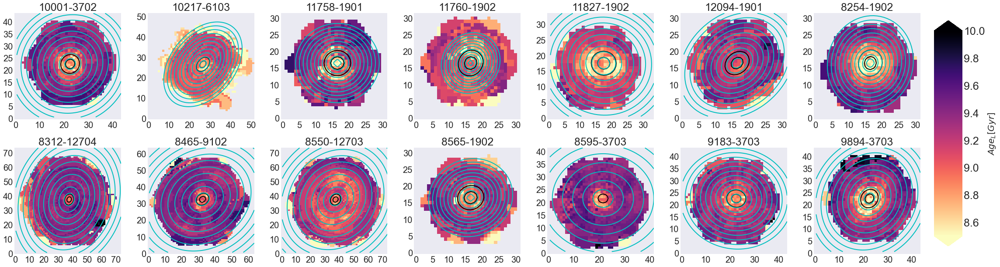

In [35]:
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9),constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits)
    AgeL_map = hdu['GYR_LW'].data
    AgeL_map[AgeL_map == 0] = np.nan
    r_reff_map = hdu['R/Reff'].data
    ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']
    hdu.close()
    ax = fig.add_subplot(2,7,int(num))
    im = ax.imshow(AgeL_map, vmin=8.5, vmax=10.0, origin='lower', cmap='magma_r')

# levels = np.array([0.5, 1.0, 3.0])
    ellip_r_contour = ax.contour(ellip_r_map, levels=np.arange(1, 3, 1), origin='lower', colors='k',
    linewidths=2)
    r_reff_contour = ax.contour(r_reff_map, levels=np.linspace(0, 3.0, 12), origin='lower', colors='c',
    linewidths=2)
    #ax.clabel(r_reff_contour, fontsize=9, inline=1)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    ax.legend(["Reff={}".format(reff)])
    


cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical',extend='both')
cbar.ax.tick_params(labelsize=25)
cbar.set_label(label='$Age_{L}[Gyr]$', size='large', fontsize=20)
plt.tight_layout(pad=3)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_ageL_mosaic.jpeg", bbox_inches='tight') # not displaying colorbar
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_ageL_mosaic.pdf", bbox_inches='tight') # not displaying colorbar
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning:

Mean of empty slice


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning:

Mean of empty slice


[WARNING]: /Users/mmckay/conda/envs/

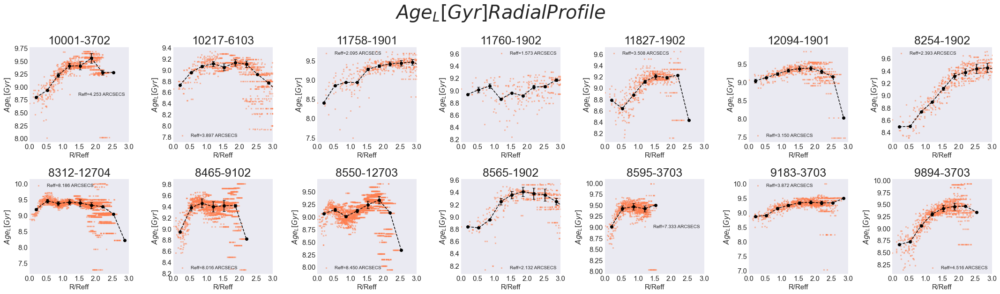

In [43]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['GYR_LW']
    ydata.loc[ydata == 0] = np.nan
    yerr = df['GYR_ERR']

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    agel_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    agel_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    agel_err_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

    # set xaxis for bin medians
    x = bins[:len(bin_meds)] + .2 # adjust for display offset


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='coral')
    ax.scatter(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    ax.errorbar(x, agel_bin_meds, yerr=agel_err_bin_meds, color='black', linestyle='--', capsize=3)
    #ax.set_ylim(8.3, 9.8)
    ax.set_xlim(0, 3)
    ax.set_xlabel('R/Reff', fontsize=15)
    ax.set_ylabel('$Age_{L}[Gyr]$', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    ax.legend(["Reff={}".format(reff)])
    hdu.close()

plt.suptitle('$Age_{L} [Gyr] Radial Profile$', fontsize=40) 
plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_ageL.jpeg") # not displaying colorbar
plt.show()

<h1><center> MW Stellar Age Data Analysis </center></h1>

In [ ]:
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# # Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
# fig = plt.figure(figsize=(30,9),constrained_layout=True)

# #axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
# for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
#     hdu = fits.open(bbrd_fits)
#     #print(int(num), bbrd_fits)
#     AgeL_map = hdu['GYR_MW'].data
#     r_reff_map = hdu['R/Reff'].data
#     ellip_r_map = hdu['ELLIP R'].data
#     plateifu = hdu[0].header['plateifu']
#     reff = hdu[0].header['REFF']
#     hdu.close()
#     ax = fig.add_subplot(2,7,int(num))
#     im = ax.imshow(AgeL_map, vmin=9.0, vmax=10.0, origin='lower', cmap='magma')

#     ellip_r_contour = ax.contour(ellip_r_map, levels = np.arange(1, 3, 1), origin='lower', colors='k',
#     linewidths=5)
#     r_reff_contour = ax.contour(r_reff_map, levels = np.arange(1, 2, 1), origin='lower', colors='c',
#     linewidths=5)
#     #ax.clabel(r_reff_contour, fontsize=9, inline=1)
#     ax.set_title('{}'.format(plateifu), fontsize=25)
#     plt.xticks(fontsize=20)
#     plt.yticks(fontsize=20)
#     ax.legend(["Reff={}".format(reff)])
    


# cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
# cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical',extend='both')
# cbar.ax.tick_params(labelsize=25)
# cbar.set_label(label='$Age_{M}[Gyr]$', size='large', fontsize=20)
# plt.tight_layout(pad=3)
# plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_ageM_mosaic.jpeg", bbox_inches='tight') # not displaying colorbar
# plt.show()

In [ ]:
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
# bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# # Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
# fig = plt.figure(figsize=(30,9), constrained_layout=True)

# #axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
# for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
#     # Read in FITS data
#     hdu = fits.open(bbrd_fits)
#     #print(int(num), bbrd_fits, bbrd_csv)
#     # ageL_map = hdu['GYR_LW'].data
#     # ageL_err_map = hdu['GYR_ERR'].data
#     # r_reff_map = hdu['R/Reff'].data
#     # # ellip_r_map = hdu['ELLIP R'].data
#     plateifu = hdu[0].header['plateifu']
#     reff = hdu[0].header['REFF']

#     # Read in CSV data
#     df = pd.read_csv(bbrd_csv)
#     xdata = df['R/REFF']
#     ydata = df['GYR_MW']
#     ydata.loc[ydata == 0] = np.nan
#     yerr = df['GYR_ERR']

#     # split data in radial bins and 
#     bins = np.linspace(0, 5, 16)
#     digitized = np.digitize(xdata, bins)

#     # Calulates the median of each bin
#     bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
#     agel_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
#     agel_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
#     agel_err_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

#     # set xaxis for bin medians
#     x = bins[:len(bin_meds)] + .2 # adjust for display offset


#     # Plotting
#     ax = fig.add_subplot(2,7,int(num))
#     ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='orange')
#     ax.scatter(x, agel_bin_meds, alpha=1.0, color='black')
#     #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
#     #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
#     ax.errorbar(x, agel_bin_meds, yerr=agel_err_bin_meds, color='black', linestyle='--', capsize=3)
#     #ax.set_ylim(9.3, 10)
#     ax.set_xlim(0, 3)
#     ax.set_xlabel('R/Reff', fontsize=15)
#     ax.set_ylabel('$Age_{M}[Gyr]$', fontsize=15)
#     ax.set_title('{}'.format(plateifu), fontsize=25)
#     plt.xticks(fontsize=15)
#     plt.yticks(fontsize=15)
#     ax.legend(["Reff={}".format(reff)])
#     hdu.close()

# plt.suptitle(r'$Age_{M}[Gyr] Radial Profile$', fontsize=40)  
# plt.tight_layout(pad=2)
# plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_ageM_radpro.jpeg") # not displaying colorbar
# plt.show()

## LW and MW stellar age radial profile

In [ ]:
bbrd_morph_df = pd.read_csv('/Users/mmckay/Desktop/research/FMR_MZR/final_galzoo_MaNGAbbrd_crossmatch.csv')

morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == '8312-12704']['gz2class']
morph.to_string().split()[1]

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning:

Mean of empty slice


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice fro

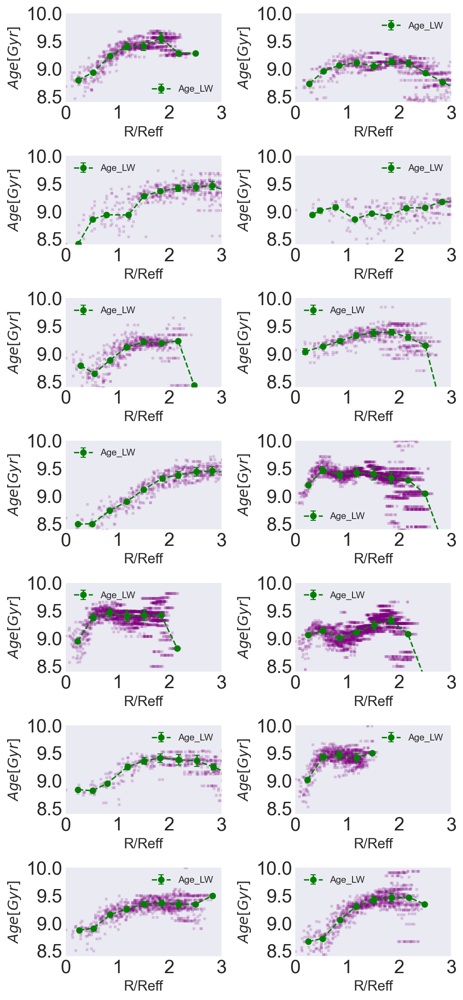

In [ ]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")
bbrd_morph_df = pd.read_csv('/Users/mmckay/Desktop/research/FMR_MZR/final_galzoo_MaNGAbbrd_crossmatch.csv')


# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(7,15), constrained_layout=True, dpi=150)


#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    # Read in morphology data 
    if plateifu == '11827-1902' or plateifu == '12094-1901':
        morph = 'N/A'
    else:
        morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
        morph = morph.to_string().split()[1]
    #print(morph)
    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['GYR_MW']
    ydata.loc[ydata == 0] = np.nan # Removing 0 values
    ydata1 = df['GYR_LW']
    ydata1.loc[ydata1 == 0] = np.nan # Removing 0 values
    yerr = df['GYR_ERR']

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_err_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]
    ydata1_bin_meds = [ydata1[digitized == i].median() for i in range(1, len(bins))]


    # Plotting
    ax = fig.add_subplot(7,2,int(num))
    # ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.2, color='green')
    ax.scatter(xdata, ydata1, s=6, marker='x', alpha=0.2, color='purple')
    #ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='black')
    #ax.plot(x, ydata_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, ydata_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    #ax.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=ydata_err_bin_meds, color='purple', linestyle='--', capsize=3,fmt='o', label='Age_MW')
    ax.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=ydata_err_bin_meds, color='green', linestyle='--', capsize=3,fmt='o', label='Age_LW')
    ax.set_ylim(8.4, 10)
    ax.set_xlim(0, 3)
    ax.set_xlabel('R/Reff', fontsize=15)
    ax.set_ylabel('$Age [Gyr]$', fontsize=15)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    # ax.set_title('{}'.format(plateifu), fontsize=11)
    # ax.axvline(1.0, label=["Reff={}".format(reff)])

    # ax.text(2.5, 8.4, morph, fontsize=18, fontweight='bold')
    plt.legend()
    
    #ax.legend(["Reff={}".format(reff)])
    hdu.close()

#plt.suptitle(r'$Age_{M}[Gyr] Radial Profile$', fontsize=40)
plt.tight_layout()
# matplotlib.use("pgf")
# matplotlib.rcParams.update({
#     "pgf.texsystem": "pdflatex",
#     'font.family': 'serif',
#     'text.usetex': True,
#     'pgf.rcfonts': False,
# })

plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_agecombo_radpro.pdf") 
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning:

Mean of empty slice


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:13: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/

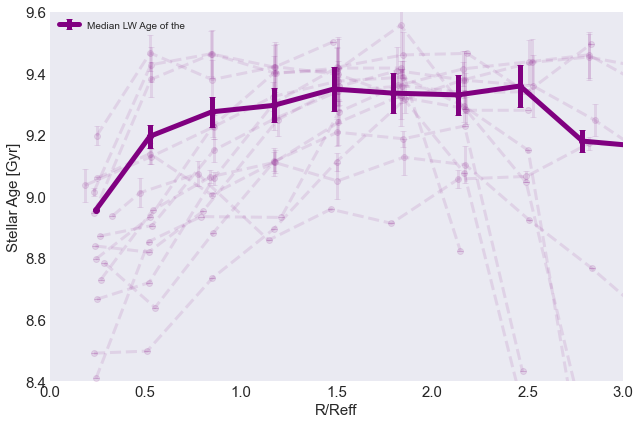

In [ ]:
# All radial profiles
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")



# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(9,6), constrained_layout=True)


for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['GYR_MW']
    ydata1 = df['GYR_LW']
    ydata.loc[ydata == 0] = np.nan # Removing 0 values
    ydata1.loc[ydata1 == 0] = np.nan # Removing 0 values
    yerr = df['GYR_ERR']
    plateifu = hdu[0].header['plateifu']

    if plateifu == '11827-1902' or plateifu == '12094-1901':
        morph = 'N/A'
    else:
        morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
        morph = morph.to_string().split()[1]

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]
    yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]
    ydata1_bin_meds = [ydata1[digitized == i].median() for i in range(1, len(bins))]

    # plt.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='green', linestyle='--', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
    plt.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='purple', linestyle='--', capsize=3, linewidth=3.0, fmt='o', alpha=0.1)

    # # Plotting
    # if morph == 'SBc(rc)' or morph == 'SBb':
    #     pass
    #     plt.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='pink', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
    #     plt.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='pink', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        

    # elif  morph == 'Er':
    #     plt.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
    #     plt.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        
    
    # elif  morph == 'Sb(r)' or morph == 'Sb(i)' or morph == 'Sb2l':
    #     plt.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='orange', linestyle='--', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
    #     plt.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='orange', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        

    
    # elif morph == 'N/A':
    #     plt.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='aqua', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
    #     plt.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='aqua', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
    #     hdu.close()
    
    
    #hdu.close()
    # plt = fig.add_subplot(2,7,int(num))
    # plt.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='black')
    # plt.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua')
    # plt.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua')
    # #plt.plot(x, agel_bin_meds, alpha=1.0, color='black')
    # #plt.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    # #plt.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)

    # plt.title('{}'.format(plateifu), fontsize=25)

    # plt.legend(["Reff={}".format(reff)])
    # #plt.plthline(1.4, color='black')

# Median fit of all the BBRD galaxies from made CSV file
bbrd_csv_combo = "/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_combo.csv"
df = pd.read_csv(bbrd_csv_combo)
df.dropna(axis=0,how='any', inplace=True)
xdata = df['R/REFF']
ydata = df['GYR_MW']
ydata.loc[ydata == 0] = np.nan # Removing 0 values
ydata1 = df['GYR_LW']
ydata1.loc[ydata1 == 0] = np.nan # Removing 0 values
yerr = df['GYR_ERR']
# split data in radial bins and 
bins = np.linspace(0, 5, 16)
digitized = np.digitize(xdata, bins)
# Calulates the median of each bin
xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
ydata1_bin_meds = [ydata1[digitized == i].median() for i in range(1, len(bins))]
yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

# least square polynomial fit
# xdata.dropna(inplace=True)
# ydata1.dropna(inplace=True)

# m1, b1 = np.polyfit(xdata, ydata1, 1)
# ydata1_fit = (m1 * xdata) + b1
# plt.plot(xdata, ydata1_fit, color='black', linewidth=3, alpha=0.5)
# m1, b1 = np.polyfit(xdata, ydata1, 1)
# ydata1_fit = (m1 * xdata) + b1
# plt.plot(xdata, ydata1_fit, color='black', linewidth=3, alpha=0.5)
# coef = np.polyfit(xdata, ydata1, 3)
# polyfit_fn = np.poly1d(coef)
# m, b = np.polyfit(xdata, ydata, 1)
# ydata_fit = (m * xdata) + b
# plt.plot(xdata, ydata_fit, color='black', linewidth=3, alpha=0.5)

# plt.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='green', linestyle='-', capsize=3, linewidth=5, fmt='o', alpha=1, label='LW Age slope = {}'.format(np.round(m, 3)))
plt.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='purple', linestyle='-', capsize=3, linewidth=5, fmt='o', alpha=1, label='Median LW Age of the ')






# plt.scatter(xdata, ydata, color='blue', marker='x')
# plt.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='green', linewidth=5)
# plt.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='black', linewidth=5)

# plt.scatter(xdata_bin_meds, ydata1_bin_meds, alpha=1.0, color='purple', linewidth=5)
# plt.plot(xdata_bin_meds, ydata1_bin_meds, alpha=1.0, color='black', linewidth=5)

# least square polynomial fit
# xdata.dropna(inplace=True)
# ydata.dropna(inplace=True)
# coef = np.polyfit(xdata, ydata, 3)
# polyfit_fn = np.poly1d(coef)
# m, b = np.polyfit(xdata, ydata, 1)
# ydata_fit = (m * xdata) + b
# plt.plot(xdata, ydata_fit, color='black', linewidth=3, alpha=0.5)

# m1, b1 = np.polyfit(xdata, ydata1, 1)
# ydata1_fit = (m1 * xdata) + b1
# plt.plot(xdata, ydata1_fit, color='black', linewidth=3, alpha=0.5)

#plt.plot(xdata, ydata, color='black')
# plt.plot(np.sort(xdata), np.sort(polyfit_fn(ydata)), color='red')
# plt.suptitle('$\Delta\Sigma_{SFR} Radial Profile$', fontsize=12)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15) 
plt.tight_layout(pad=2)
plt.ylim(8.4, 9.6)
plt.xlim(0, 3.0)
plt.xlabel('R/Reff', fontsize=15)
plt.ylabel('Stellar Age [Gyr]', fontsize=15)
plt.legend()
plt.tight_layout()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_single_agecombo_radpro.jpeg") 
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:13: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/9894-3703_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/numpy/

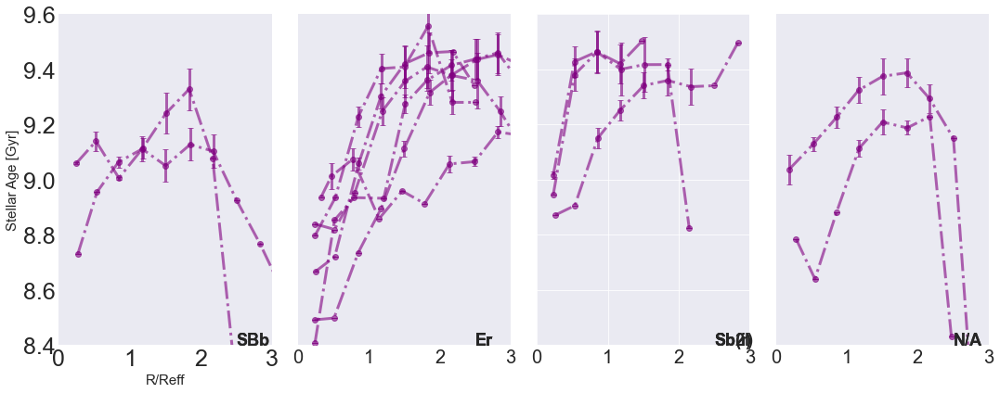

In [ ]:
# Age median radial profile seperated by morphology
# All radial profiles
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
#fig = plt.figure(figsize=(8,6), constrained_layout=True)
fig, (ax0,ax1,ax2,ax3) = plt.subplots(1,4, figsize=(15,6), constrained_layout=True, sharex=True, sharey=True)


for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['GYR_MW']
    ydata.loc[ydata == 0] = np.nan # Removing 0 values
    ydata1 = df['GYR_LW']
    ydata1.loc[ydata1 == 0] = np.nan # Removing 0 values
    yerr = df['GYR_ERR']
    plateifu = hdu[0].header['plateifu']


    if plateifu == '11827-1902' or plateifu == '12094-1901':
        morph = 'N/A'
    else:
        morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
        morph = morph.to_string().split()[1]

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]
    yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]
    ydata1_bin_meds = [ydata1[digitized == i].median() for i in range(1, len(bins))]

    # Plotting
    if morph == 'SBc(rc)' or morph == 'SBb':
        # ax0.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='purple', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax0.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='purple', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax0.set_ylim(8.4, 9.6)
        ax0.set_xlim(0, 3.0)
        ax0.set_xlabel('R/Reff', fontsize=15)
        ax0.set_ylabel('Stellar Age [Gyr]', fontsize=15)
        #ax0.set_xticklabels([0,1,2,3],Fontsize=15)
        ax0.tick_params(axis='x', labelsize=25)
        ax0.tick_params(axis='y', labelsize=25)
        ax0.text(2.5, 8.4, morph, fontsize=18, fontweight='bold')

        

    elif  morph == 'Er':
        # ax1.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='purple', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax1.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='purple', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax1.tick_params(axis='x', labelsize=20)
        ax1.text(2.5, 8.4, morph, fontsize=18, fontweight='bold')
        ax1.grid()
        
        
    
    elif  morph == 'Sb(r)' or morph == 'Sb(i)' or morph == 'Sb2l':
        # ax2.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='purple', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax2.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='purple', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax2.tick_params(axis='x', labelsize=20)
        ax2.text(2.5, 8.4, morph, fontsize=18, fontweight='bold')
        ax2.grid()
        

    elif morph == 'N/A':
        # ax3.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='purple', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax3.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='purple', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax3.tick_params(axis='x', labelsize=20)
        ax3.text(2.5, 8.4, morph, fontsize=18, fontweight='bold')
        ax3.grid()
        
    hdu.close()

    


plt.legend()
plt.tight_layout()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_age_morph_subplot_radpro.jpeg") 
plt.show()

<h1><center> Star Formation Surface Density (Halpha) Data Analysis </center></h1>

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:52: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:52: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




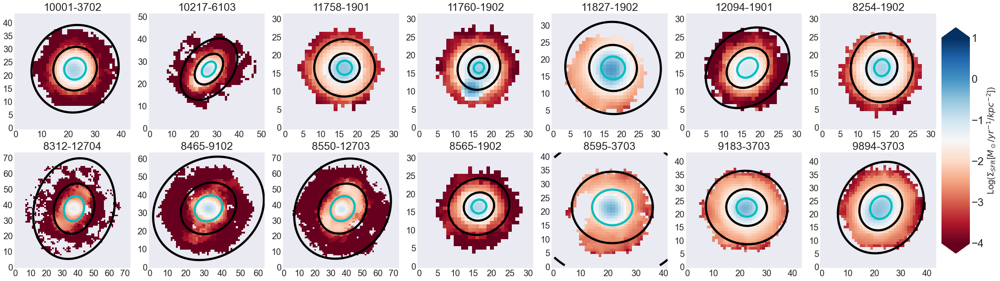

In [10]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits)
    logsfrd_map = hdu['LOGSFR DENSITY'].data
    r_reff_map = hdu['R/Reff'].data
    ellip_r_map = hdu['ELLIP R'].data
    nsa_z = float(hdu[0].header['z'].split()[0])
    reff = hdu[0].header['REFF']
    plateifu = hdu[0].header['plateifu']

    # if plateifu == '11827-1902' or plateifu == '12094-1901':
    #     morph = 'N/A'
    # else:
    #     morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
    #     morph = morph.to_string().split()[1]

    # Caculate angular diamenter distance of an HII region (30 ly diameter - 0.00919804kpc) or NGC 604 (830 ly - 0.254479 kpc) or GMC (600 ly - 0.183961 kpc)
    angle_diameter_distance = cosmo.kpc_proper_per_arcmin(nsa_z).to(u.kpc/u.arcsec) #kpc/arcsec
    h2_region_diamerter_dist = (angle_diameter_distance / (0.254479*u.kpc))**-1 # arcsec

    hdu.close()
    ax = fig.add_subplot(2,7,int(num))
    im = ax.imshow(logsfrd_map, vmin=-4.0, vmax=1.0, origin='lower', cmap='RdBu')

    # ellip_r_contour = ax.contour(ellip_r_map, levels = np.arange(1, 3, 1), origin='lower', colors='k',
    # linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.linspace(1, 2, 2), origin='lower', colors='k', linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.linspace(0.5, 0.5, 1), origin='lower', colors='c', linewidths=5)

    # h2_region_approx_rad = ax.contour(ellip_r_map, levels = np.linspace(0, h2_region_diamerter_dist.value, 2),
    # origin='lower', colors='m',
    # linewidths=3)
    #ax.clabel(r_reff_contour, fontsize=9, inline=1)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    ax.legend(["Reff={}".format(reff)])
    # ax.text(2.5, 2.5, morph, fontsize=20, fontweight='bold')
    


cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical',extend='both')
cbar.ax.tick_params(labelsize=25)
cbar.set_label(label=r'Log($\Sigma_{SFR}$[$M_\odot/yr^{-1}/kpc^{-2}$])', size='large', fontsize=20)
plt.tight_layout()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_logSFRrho_mosaic.jpeg", bbox_inches='tight') # not displaying colorbar
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_logSFRrho_mosaic.pdf", bbox_inches='tight') # not displaying colorbar
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning:

Mean of empty slice


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:67: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




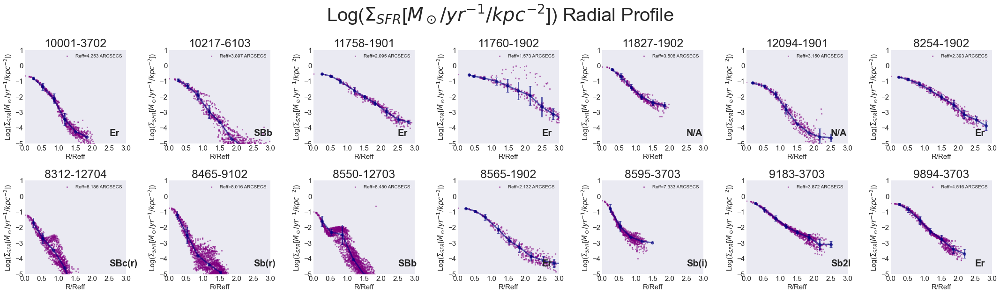

In [55]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    if plateifu == '11827-1902' or plateifu == '12094-1901':
        morph = 'N/A'
    else:
        morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
        morph = morph.to_string().split()[1]

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['LOGSFR DENSITY']
    #yerr = df['D4000_ERR']

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    yerr_bin_meds = [ydata[digitized == i].std() for i in range(1, len(bins))]

    # set xaxis for bin medians
    x = bins[:len(xdata_bin_meds)] + .2 # adjust for display offset


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    ax.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='navy', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
    ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='purple')
    # ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='black')
    # ax.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='black')
    #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    #ax.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)
    ax.set_ylim(-5, 1)
    ax.set_xlim(0, 3)
    ax.set_xlabel('R/Reff', fontsize=15)
    ax.set_ylabel(r'Log($\Sigma_{SFR}$[$M_\odot/yr^{-1}/kpc^{-2}$])', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    ax.legend(["Reff={}".format(reff)])
    ax.text(2.5, -4.5, morph, fontsize=20, fontweight='bold')
    #ax.axhline(1.4, color='black')
    hdu.close()

plt.suptitle(r'Log($\Sigma_{SFR}$[$M_\odot/yr^{-1}/kpc^{-2}$]) Radial Profile', fontsize=40)  
plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_logSFRrho_radpro.jpeg") # not displaying colorbar
plt.show()

No handles with labels found to put in legend.
[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:83: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




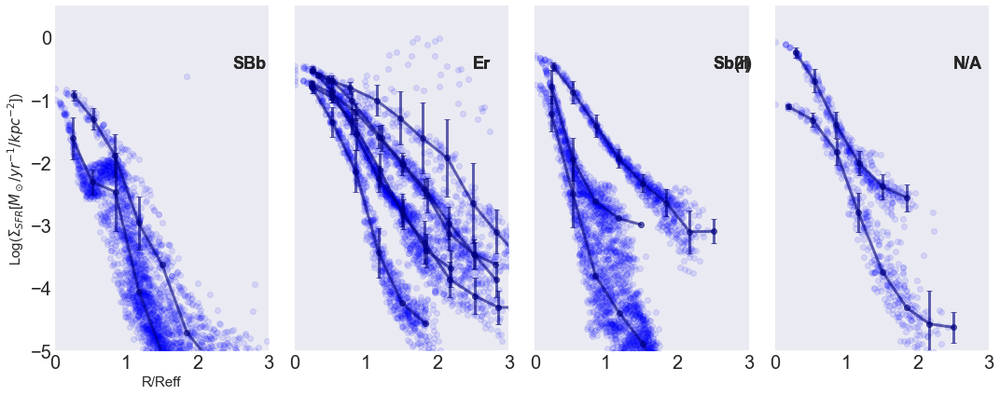

In [56]:
# Age median radial profile seperated by morphology
# All radial profiles
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")
bbrd_morph_df = pd.read_csv('/Users/mmckay/Desktop/research/FMR_MZR/final_galzoo_MaNGAbbrd_crossmatch.csv')

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
#fig = plt.figure(figsize=(8,6), constrained_layout=True)
fig, (ax0,ax1,ax2,ax3) = plt.subplots(1,4, figsize=(15,6), constrained_layout=True, sharex=True, sharey=True)


for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['LOGSFR DENSITY']
    #ydata.loc[ydata == 0] = np.nan # Removing 0 values
    #ydata1 = df['GYR_LW']
    #ydata1.loc[ydata1 == 0] = np.nan # Removing 0 values
    #yerr = df['GYR_ERR']
    
    plateifu = hdu[0].header['plateifu']
    if plateifu == '11827-1902' or plateifu == '12094-1901':
        morph = 'N/A'
    else:
        morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
        morph = morph.to_string().split()[1]

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    yerr_bin_meds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #ydata1_bin_meds = [ydata1[digitized == i].median() for i in range(1, len(bins))]

    # Plotting
    if morph == 'SBc(rc)' or morph == 'SBb':
        ax0.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='navy', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax0.scatter(xdata, ydata, color='blue', alpha=0.1)
        #ax0.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='green', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax0.set_ylim(-5, 0.5)
        ax0.set_xlim(0, 3.0)
        ax0.set_xlabel('R/Reff', fontsize=15)
        ax0.set_ylabel(r'Log($\Sigma_{SFR}$[$M_\odot/yr^{-1}/kpc^{-2}$])', fontsize=15)
        #ax0.set_xticklabels([0,1,2,3],Fontsize=15)
        ax0.tick_params(axis='x', labelsize=20)
        ax0.tick_params(axis='y', labelsize=20)
        ax0.text(2.5, -0.5, morph, fontsize=18, fontweight='bold')

        

    elif  morph == 'Er':
        ax1.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='navy', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax1.scatter(xdata, ydata, color='blue', alpha=0.1)
        ax1.tick_params(axis='x', labelsize=20)
        ax1.text(2.5, -0.5, morph, fontsize=18, fontweight='bold')
        
        
    
    elif  morph == 'Sb(r)' or morph == 'Sb(i)' or morph == 'Sb2l':
        ax2.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='navy', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax2.scatter(xdata, ydata, color='blue', alpha=0.1)
        ax2.tick_params(axis='x', labelsize=20)
        ax2.text(2.5, -0.5, morph, fontsize=18, fontweight='bold')
        

    elif morph == 'N/A':
        ax3.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='navy', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax3.scatter(xdata, ydata, color='blue', alpha=0.1)
        ax3.tick_params(axis='x', labelsize=20)
        ax3.text(2.5, -0.5, morph, fontsize=18, fontweight='bold')
        
    hdu.close()

    


plt.legend()
plt.tight_layout()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_sfrd_morph_subplot_radpro.jpeg") 
plt.show()

<h1><center> Delta Star Formation Surface Density (Halpha) Data Analysis </center></h1>

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:44: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:44: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




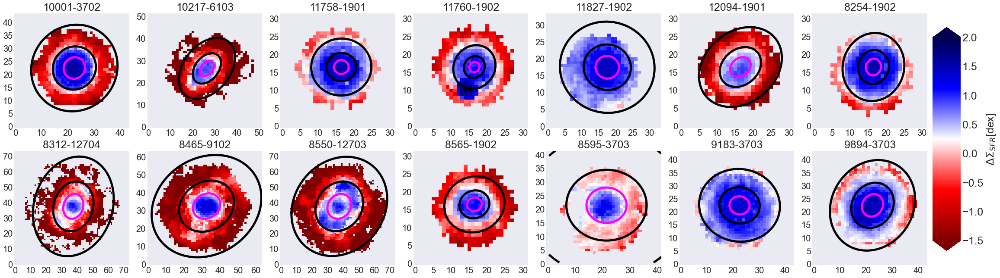

In [7]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# Plot Mosaic of BBRD sample
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits)
    map_2d = hdu['B20_DELTASFR'].data
    r_reff_map = hdu['R/Reff'].data
    ellip_r_map = hdu['ELLIP R'].data
    reff = hdu[0].header['REFF']
    plateifu = hdu[0].header['plateifu']
    
    # if plateifu == '11827-1902' or plateifu == '12094-1901':
    #     morph = 'N/A'
    # else:
    #     morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
    #     morph = morph.to_string().split()[1]
    
    hdu.close()

    ax = fig.add_subplot(2,7,int(num))
    im = ax.imshow(map_2d, vmin=-1.5, vmax=2.0, origin='lower', cmap='seismic_r')
    # ellip_r_contour = ax.contour(ellip_r_map, levels = np.arange(1, 3, 1), origin='lower', colors='g', linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.linspace(0.5, 0.5, 1), origin='lower', colors='magenta', linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.linspace(1, 2, 2), origin='lower', colors='k', linewidths=5)
    # r_reff_contour = ax.contour(r_reff_map, levels = np.arange(1, 2, 1), origin='lower', colors='c', linewidths=5)

        #ax.clabel(r_reff_contour, fontsize=9, inline=1)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    ax.legend(["Reff={}".format(reff)])
    # ax.text(2.5, 2.5, morph, fontsize=20, fontweight='bold')
    


cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical', extend='both')
cbar.ax.tick_params(labelsize=25)
cbar.set_label(label=r'$\Delta\Sigma_{SFR}$[dex]', size='large', fontsize=25)
plt.tight_layout()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_DeltaSFR_mosaic.jpeg", bbox_inches='tight') # not displaying colorbar
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_DeltaSFR_mosaic.pdf", bbox_inches='tight') # not displaying colorbar

plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:67: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




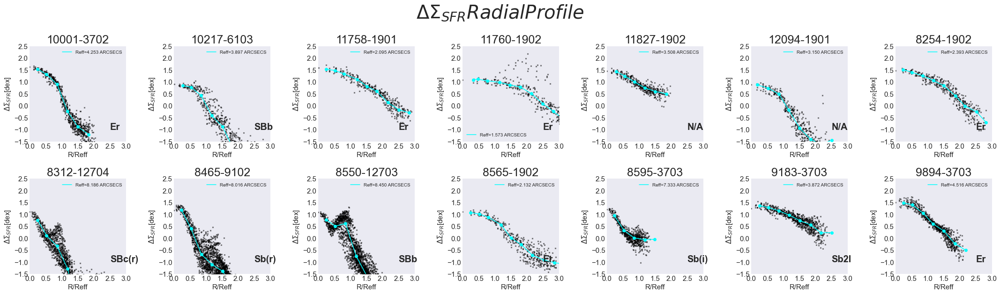

In [58]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']
    

    if plateifu == '11827-1902' or plateifu == '12094-1901':
        morph = 'N/A'
    else:
        morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
        morph = morph.to_string().split()[1]

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['B20_DELTASFR']
    #yerr = df['D4000_ERR']

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

    # set xaxis for bin medians
    #x = bins[:len(xdata_bin_meds)] + .2 # adjust for display offset


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='black')
    ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua')
    ax.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua')
    #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    #ax.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)
    ax.set_ylim(-1.5, 2.5)
    ax.set_xlim(0, 3)
    ax.set_xlabel('R/Reff', fontsize=15)
    ax.set_ylabel('$\Delta\Sigma_{SFR}$[dex]', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    ax.legend(["Reff={}".format(reff)])
    ax.text(2.5, -1.0, morph, fontsize=20, fontweight='bold')
    #ax.axhline(1.4, color='black')
    hdu.close()

plt.suptitle('$\Delta\Sigma_{SFR} Radial Profile$', fontsize=40)  
plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_deltaSFR_radpro.jpeg") # not displaying colorbar
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:102: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




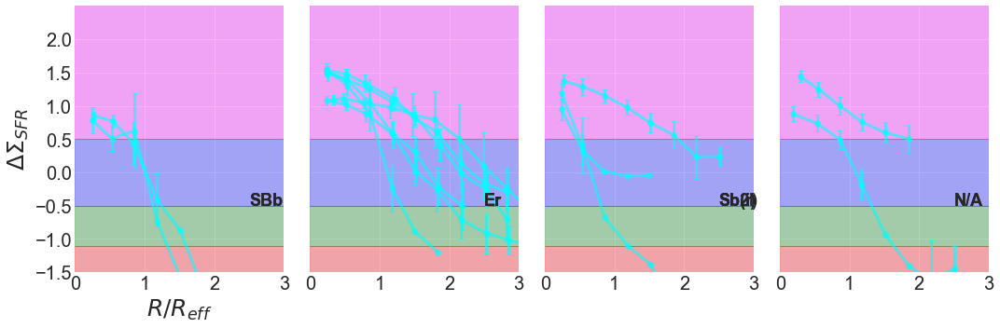

In [59]:
# Age median radial profile seperated by morphology
# All radial profiles
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
#fig = plt.figure(figsize=(8,6), constrained_layout=True)
fig, (ax0,ax1,ax2,ax3) = plt.subplots(1,4, figsize=(15,5), constrained_layout=True, sharex=True, sharey=True)


for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['B20_DELTASFR']
    #ydata.loc[ydata == 0] = np.nan # Removing 0 values
    #ydata1 = df['GYR_LW']
    #ydata1.loc[ydata1 == 0] = np.nan # Removing 0 values
    #yerr = df['GYR_ERR']
    
    plateifu = hdu[0].header['plateifu']
    if plateifu == '11827-1902' or plateifu == '12094-1901':
        morph = 'N/A'
    else:
        morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
        morph = morph.to_string().split()[1]

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    yerr_bin_meds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #ydata1_bin_meds = [ydata1[digitized == i].median() for i in range(1, len(bins))]

    # Plotting
    if morph == 'SBc(rc)' or morph == 'SBb':
        ax0.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='cyan', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        #ax0.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='green', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax0.set_ylim(-1.5, 2.5)
        ax0.set_xlim(0, 3.0)
        start, end = ax0.get_ylim()
        ax0.yaxis.set_ticks(np.arange(start, end, .5))
        #ax0.set_yticklabels([-1.5, -1, -.5, 0, 1,])
        ax0.set_xlabel(r'$R/R_{eff}$', fontsize=25, fontweight='bold')
        ax0.set_ylabel(r'$\Delta\Sigma_{SFR}$', fontsize=25, fontweight='bold')
        #ax0.set_xticklabels([0,1,2,3],Fontsize=15)
        ax0.tick_params(axis='x', labelsize=20)
        ax0.tick_params(axis='y', labelsize=20)
        ax0.text(2.5, -0.5, morph, fontsize=18, fontweight='bold')
        #ax0.hlines(-1.1,xmin=0, xmax=3, color='red')
        # ax0.axhspan(-1.1, -1.5, alpha=0.3, color='red')
        # ax0.axhspan(-1.1, -0.5, alpha=0.3, color='green')
        # ax0.axhspan(-0.5, 0.5, alpha=0.3, color='blue')
        # ax0.axhspan(0.5, 3.0, alpha=0.3, color='magenta')

        

    elif  morph == 'Er':
        ax1.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='cyan', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax1.tick_params(axis='x', labelsize=20)
        ax1.text(2.5, -0.5, morph, fontsize=18, fontweight='bold')
        # ax1.axhspan(-1.1, -1.5, alpha=0.3, color='red')
        # ax1.axhspan(-1.1, -0.5, alpha=0.3, color='green')
        # ax1.axhspan(-0.5, 0.5, alpha=0.3, color='blue')
        # ax1.axhspan(0.5, 3.0, alpha=0.3, color='magenta')
        
        
    
    elif  morph == 'Sb(r)' or morph == 'Sb(i)' or morph == 'Sb2l':
        ax2.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='cyan', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax2.tick_params(axis='x', labelsize=20)
        ax2.text(2.5, -0.5, morph, fontsize=18, fontweight='bold')
        # ax2.axhspan(-1.1, -1.5, alpha=0.3, color='red')
        # ax2.axhspan(-1.1, -0.5, alpha=0.3, color='green')
        # ax2.axhspan(-0.5, 0.5, alpha=0.3, color='blue')
        # ax2.axhspan(0.5, 3.0, alpha=0.3, color='magenta')
        

    elif morph == 'N/A':
        ax3.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='cyan', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax3.tick_params(axis='x', labelsize=20)
        ax3.text(2.5, -0.5, morph, fontsize=18, fontweight='bold')

        # ax3.axhspan(0.5, 3.0, alpha=0.3, color='magenta')
        
    hdu.close()

    

#plt.grid()
# plt.legend()
for ax in [ax0,ax1,ax2,ax3]:
    ax.axhspan(-1.1, -1.5, alpha=0.3, color='red')
    ax.axhspan(-1.1, -0.5, alpha=0.3, color='green')
    ax.axhspan(-0.5, 0.5, alpha=0.3, color='blue')
    ax.axhspan(0.5, 3.0, alpha=0.3, color='magenta')
    ax.grid()
plt.tight_layout()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_deltasfr_morph_subplot_radpro.jpeg") 
plt.show()

<h1><center> Specific Star Fromation Rate </center></h1>

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:66: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




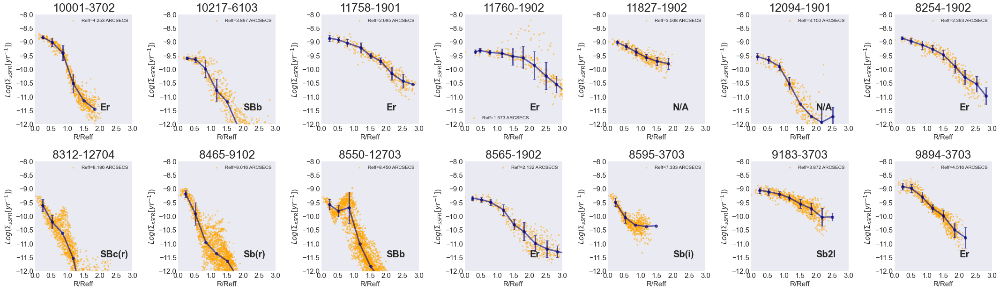

In [60]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    if plateifu == '11827-1902' or plateifu == '12094-1901':
        morph = 'N/A'
    else:
        morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
        morph = morph.to_string().split()[1]

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['LOGSFR DENSITY'] - df['MSUN/SPX2']
    #yerr = df['D4000_ERR']

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    yerr_bin_meds = [ydata[digitized == i].std() for i in range(1, len(bins))]

    # set xaxis for bin medians
    x = bins[:len(xdata_bin_meds)] + .2 # adjust for display offset


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    ax.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='navy', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
    ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='orange')
    # ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='black')
    # ax.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='black')
    #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    #ax.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)
    ax.set_ylim(-12, -8)
    ax.set_xlim(0, 3)
    ax.set_xlabel('R/Reff', fontsize=15)
    ax.set_ylabel(r'$Log(\Sigma_{sSFR}[yr^{-1}]$)', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    ax.legend(["Reff={}".format(reff)])
    ax.text(2, -11.5, morph, fontsize=20, fontweight='bold')
    #ax.axhline(1.4, color='black')
    hdu.close()

plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_logsSFRradpro.jpeg") # not displaying colorbar
plt.show()

No handles with labels found to put in legend.
[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:90: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




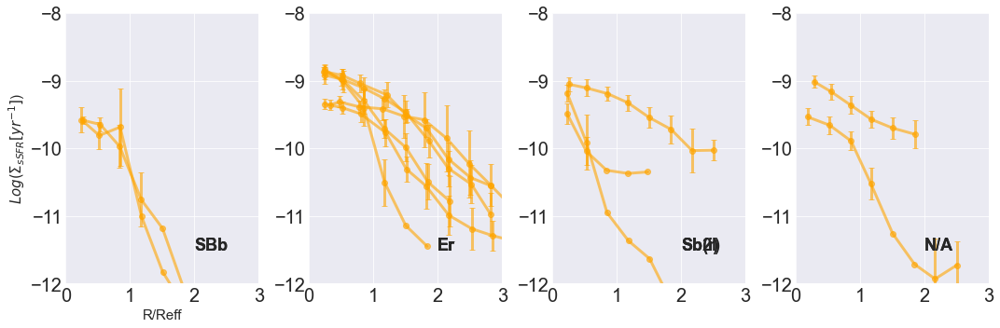

In [61]:
# Age median radial profile seperated by morphology
# All radial profiles
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")
bbrd_morph_df = pd.read_csv('/Users/mmckay/Desktop/research/FMR_MZR/final_galzoo_MaNGAbbrd_crossmatch.csv')

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
#fig = plt.figure(figsize=(8,6), constrained_layout=True)
fig, (ax0,ax1,ax2,ax3) = plt.subplots(1,4, figsize=(15,5), constrained_layout=True, sharex=True)


for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['LOGSFR DENSITY'] - df['MSUN/SPX2']
    #ydata.loc[ydata == 0] = np.nan # Removing 0 values
    #ydata1 = df['GYR_LW']
    #ydata1.loc[ydata1 == 0] = np.nan # Removing 0 values
    #yerr = df['GYR_ERR']
    
    plateifu = hdu[0].header['plateifu']
    if plateifu == '11827-1902' or plateifu == '12094-1901':
        morph = 'N/A'
    else:
        morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
        morph = morph.to_string().split()[1]

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    yerr_bin_meds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #ydata1_bin_meds = [ydata1[digitized == i].median() for i in range(1, len(bins))]

    # Plotting
    if morph == 'SBc(rc)' or morph == 'SBb':
        ax0.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='orange', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        #ax0.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='orange', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax0.set_ylim(5.5, 9.0)
        ax0.set_xlim(0, 3.0)
        ax0.set_xlabel('R/Reff', fontsize=15)
        ax0.set_ylabel(r'$Log(\Sigma_{sSFR}[yr^{-1}]$)', fontsize=15)
        # #ax0.set_xticklabels([0,1,2,3],Fontsize=15)
        # ax0.tick_params(axis='x', labelsize=20)
        # ax0.tick_params(axis='y', labelsize=20)
        ax0.text(2, -11.5, morph, fontsize=18, fontweight='bold')

        

    elif  morph == 'Er':
        ax1.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='orange', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        # ax1.tick_params(axis='x', labelsize=20)
        ax1.text(2, -11.5, morph, fontsize=18, fontweight='bold')
        # ax1.set_ylim(5.5, 9.0)
        # ax1.tick_params(axis='y', labelsize=20)
        
        
    
    elif  morph == 'Sb(r)' or morph == 'Sb(i)' or morph == 'Sb2l':
        ax2.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='orange', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        # ax2.tick_params(axis='x', labelsize=20)
        ax2.text(2, -11.5, morph, fontsize=18, fontweight='bold')
        # ax2.set_ylim(5.5, 9.0)
        # ax2.tick_params(axis='y', labelsize=20)
        

    elif morph == 'N/A':
        ax3.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='orange', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax3.text(2, -11.5, morph, fontsize=18, fontweight='bold')
        
        
        
        
        
    hdu.close()

for ax in [ax0,ax1,ax2,ax3]:
    ax.set_ylim(-12, -8)
    ax.tick_params(axis='y', labelsize=20)
    ax.tick_params(axis='x', labelsize=20)
    ax.grid()


plt.legend()
plt.tight_layout()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_logsSFR_morph_subplot_radpro.jpeg") 
plt.show()

<h1><center> Stellar Mass Surface Density Data Analysis </center></h1>

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:35: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:35: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




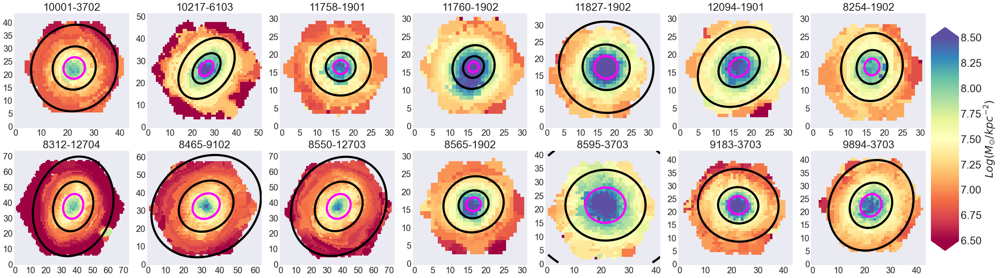

In [12]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# Plot Mosaic of BBRD sample
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits)
    map_2d = hdu['MSUN/SPX2'].data
    r_reff_map = hdu['R/Reff'].data
    ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']
    hdu.close()

    ax = fig.add_subplot(2,7,int(num))
    im = ax.imshow(map_2d, vmin=6.5, vmax=8.5, origin='lower', cmap='Spectral')
    # ellip_r_contour = ax.contour(ellip_r_map, levels = np.arange(1, 3, 1), origin='lower', colors='g',linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.linspace(1, 2, 2), origin='lower', colors='k', linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.linspace(0.5, 0.5, 1), origin='lower', colors='magenta', linewidths=5)
    #ax.clabel(r_reff_contour, fontsize=9, inline=1)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=20)
    
    plt.yticks(fontsize=20)
    ax.legend(["Reff={}".format(reff)])
    


cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical', extend='both')
cbar.ax.tick_params(labelsize=25)
cbar.set_label(label=r'$Log(M_{\odot}/kpc^{-2})$', size='large', fontsize=25)
plt.tight_layout()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_masskpc2_mosaic.jpeg", bbox_inches='tight') # not displaying colorbar
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_masskpc2_mosaic.pdf", bbox_inches='tight') # not displaying colorbar

plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:57: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




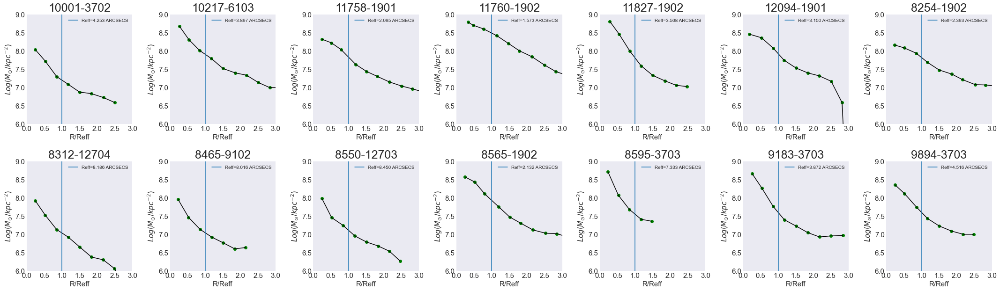

In [63]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['MSUN/SPX2']
    #ydata1 = df['GYR_LW']
    #yerr = df['GYR_ERR']

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    #ydata_err_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]
    #ydata1_bin_meds = [ydata1[digitized == i].median() for i in range(1, len(bins))]


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    #ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='orange')
    ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='green')
    ax.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, ydata_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    ax.set_ylim(6.0, 9.0)
    ax.set_xlim(0, 3)
    ax.set_xlabel('R/Reff', fontsize=15)
    ax.set_ylabel(r'$Log(M_{\odot}/kpc^{-2})$', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    ax.axvline(1.0, label="Reff={}".format(reff))
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.legend()
    
    #ax.legend(["Reff={}".format(reff)])
    hdu.close()

#plt.suptitle(r'$Age_{M}[Gyr] Radial Profile$', fontsize=40)  
plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_massden_radpro.jpeg") # not displaying colorbar
plt.show()

No handles with labels found to put in legend.
[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:85: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




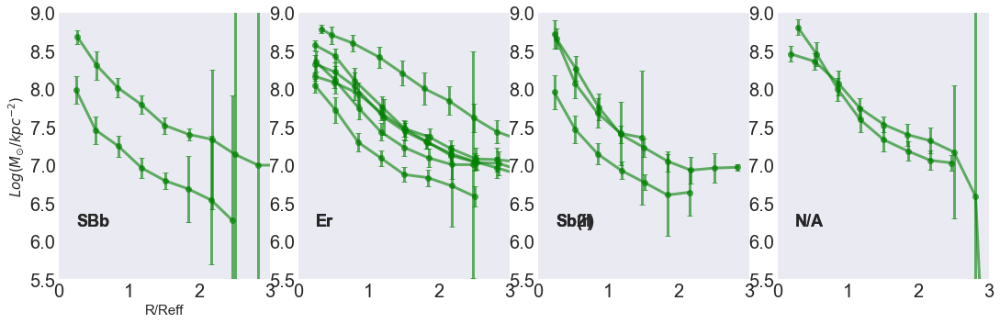

In [64]:
# Age median radial profile seperated by morphology
# All radial profiles
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")
bbrd_morph_df = pd.read_csv('/Users/mmckay/Desktop/research/FMR_MZR/final_galzoo_MaNGAbbrd_crossmatch.csv')

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
#fig = plt.figure(figsize=(8,6), constrained_layout=True)
fig, (ax0,ax1,ax2,ax3) = plt.subplots(1,4, figsize=(15,5), constrained_layout=True, sharex=True)


for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['MSUN/SPX2']
    #ydata.loc[ydata == 0] = np.nan # Removing 0 values
    #ydata1 = df['GYR_LW']
    #ydata1.loc[ydata1 == 0] = np.nan # Removing 0 values
    #yerr = df['GYR_ERR']
    
    plateifu = hdu[0].header['plateifu']
    if plateifu == '11827-1902' or plateifu == '12094-1901':
        morph = 'N/A'
    else:
        morph = bbrd_morph_df.loc[bbrd_morph_df['plateifu'] == plateifu]['gz2class']
        morph = morph.to_string().split()[1]

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    yerr_bin_meds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #ydata1_bin_meds = [ydata1[digitized == i].median() for i in range(1, len(bins))]

    # Plotting
    if morph == 'SBc(rc)' or morph == 'SBb':
        ax0.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='green', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        #ax0.errorbar(xdata_bin_meds, ydata1_bin_meds, yerr=yerr_bin_meds, color='green', linestyle='-.', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax0.set_ylim(5.5, 9.0)
        ax0.set_xlim(0, 3.0)
        ax0.set_xlabel('R/Reff', fontsize=15)
        ax0.set_ylabel(r'$Log(M_{\odot}/kpc^{-2})$', fontsize=15)
        #ax0.set_xticklabels([0,1,2,3],Fontsize=15)
        ax0.tick_params(axis='x', labelsize=20)
        ax0.tick_params(axis='y', labelsize=20)
        ax0.text(0.25, 6.2, morph, fontsize=18, fontweight='bold')

        

    elif  morph == 'Er':
        ax1.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='green', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax1.tick_params(axis='x', labelsize=20)
        ax1.text(0.25, 6.2, morph, fontsize=18, fontweight='bold')
        ax1.set_ylim(5.5, 9.0)
        ax1.tick_params(axis='y', labelsize=20)
        
        
    
    elif  morph == 'Sb(r)' or morph == 'Sb(i)' or morph == 'Sb2l':
        ax2.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='green', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax2.tick_params(axis='x', labelsize=20)
        ax2.text(0.25, 6.2, morph, fontsize=18, fontweight='bold')
        ax2.set_ylim(5.5, 9.0)
        ax2.tick_params(axis='y', labelsize=20)
        

    elif morph == 'N/A':
        ax3.errorbar(xdata_bin_meds, ydata_bin_meds, yerr=yerr_bin_meds, color='green', linestyle='-', capsize=3, linewidth=3.0, fmt='o', alpha=0.6)
        ax3.tick_params(axis='x', labelsize=20)
        ax3.text(0.25, 6.2, morph, fontsize=18, fontweight='bold')
        ax3.set_ylim(5.5, 9.0)
        ax3.tick_params(axis='y', labelsize=20)
        
    hdu.close()

    


plt.legend()
plt.tight_layout()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_massden_morph_subplot_radpro.jpeg") 
plt.show()

<h1><center> Metallicity(oxygen abundance) Data Analysis </center></h1>

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:35: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:35: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




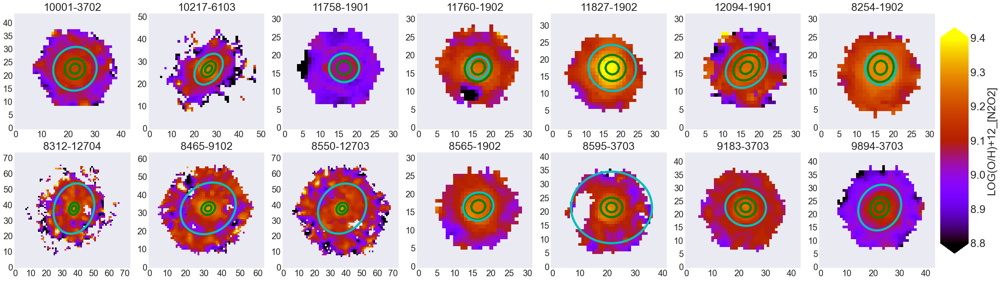

In [65]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# Plot Mosaic of BBRD sample
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits)
    map_2d = hdu['LOG(O/H)+12_[N2O2]'].data
    r_reff_map = hdu['R/Reff'].data
    ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']
    hdu.close()

    ax = fig.add_subplot(2,7,int(num))
    im = ax.imshow(map_2d, vmin=8.8, vmax=9.4, origin='lower', cmap='gnuplot')
    ellip_r_contour = ax.contour(ellip_r_map, levels = np.arange(1, 3, 1), origin='lower', colors='g',
    linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.arange(1, 2, 1), origin='lower', colors='c',
    linewidths=5)
    #ax.clabel(r_reff_contour, fontsize=9, inline=1)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    ax.legend(["Reff={}".format(reff)])
    


cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical', extend='both')
cbar.ax.tick_params(labelsize=25)
cbar.set_label(label='LOG(O/H)+12_[N2O2]', size='large', fontsize=25)
plt.tight_layout()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_metaln2o2_mosaic.jpeg", bbox_inches='tight') # not displaying colorbar
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:35: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:35: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




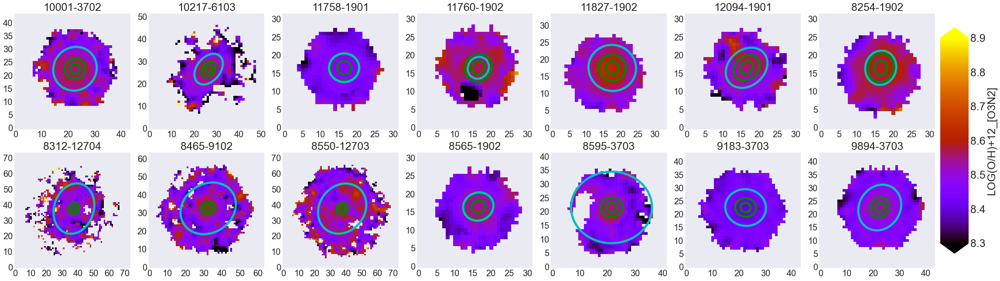

In [66]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# Plot Mosaic of BBRD sample
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits)
    map_2d = hdu['LOG(O/H)+12_[O3N2]'].data
    r_reff_map = hdu['R/Reff'].data
    ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']
    hdu.close()

    ax = fig.add_subplot(2,7,int(num))
    im = ax.imshow(map_2d, vmin=8.3, vmax=8.9, origin='lower', cmap='gnuplot')
    ellip_r_contour = ax.contour(ellip_r_map, levels = np.arange(1, 3, 1), origin='lower', colors='g',
    linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.arange(1, 2, 1), origin='lower', colors='c',
    linewidths=5)
    #ax.clabel(r_reff_contour, fontsize=9, inline=1)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    ax.legend(["Reff={}".format(reff)])
    


cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical', extend='both')
cbar.ax.tick_params(labelsize=25)
cbar.set_label(label='LOG(O/H)+12_[O3N2]', size='large', fontsize=25)
plt.tight_layout()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_metalo3n2_mosaic.jpeg", bbox_inches='tight') # not displaying colorbar
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:35: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:35: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




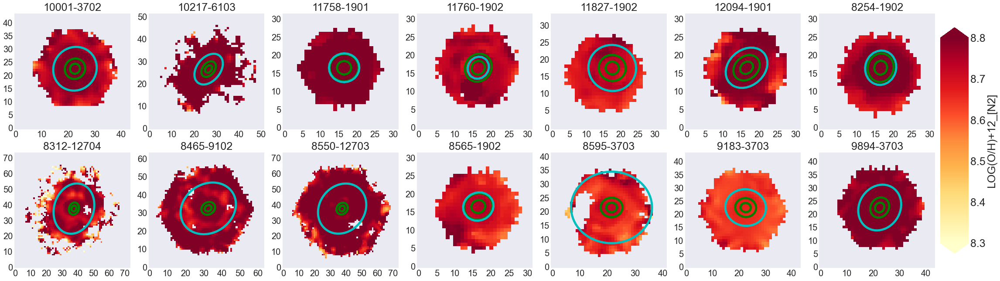

In [67]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# Plot Mosaic of BBRD sample
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits)
    map_2d = hdu['LOG(O/H)+12_[N2]'].data
    r_reff_map = hdu['R/Reff'].data
    ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']
    hdu.close()

    ax = fig.add_subplot(2,7,int(num))
    im = ax.imshow(map_2d, vmin=8.3, vmax=8.8, origin='lower', cmap='YlOrRd')
    ellip_r_contour = ax.contour(ellip_r_map, levels = np.arange(1, 3, 1), origin='lower', colors='g',
    linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.arange(1, 2, 1), origin='lower', colors='c',
    linewidths=5)
    #ax.clabel(r_reff_contour, fontsize=9, inline=1)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    ax.legend(["Reff={}".format(reff)])
    


cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical', extend='both')
cbar.ax.tick_params(labelsize=25)
cbar.set_label(label='LOG(O/H)+12_[N2]', size='large', fontsize=25)
plt.tight_layout()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_metaln2_mosaic.jpeg", bbox_inches='tight') # not displaying colorbar
plt.show()

<h1><center> BPT Diagnostic Data Analysis </center></h1>

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning:

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:49: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:49: UserWarning:

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 




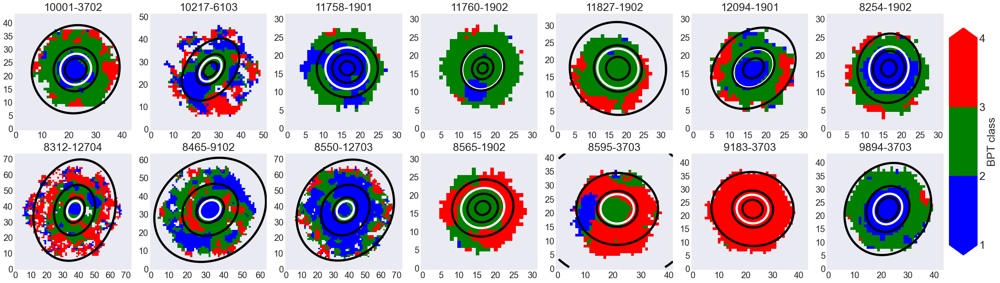

In [53]:
from matplotlib import colors
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# Plot Mosaic of BBRD sample
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits)
    map_2d = hdu['BPT_CLASS'].data
    r_reff_map = hdu['R/Reff'].data
    ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']
    hdu.close()

    ax = fig.add_subplot(2,7,int(num))
    # make a color map of fixed colors
    # Where 1:SF, 2:Comp, 3:AGN
    cmap = colors.ListedColormap(['blue','green','red'])
    bounds=[1,2,3,4]
    norm = colors.BoundaryNorm(bounds, cmap.N)
    # tell imshow about color map so that only set colors are used
    #img = ax2.imshow(combo_mask_num, interpolation='nearest', origin='lower', cmap=cmap, norm=norm)
    im = ax.imshow(map_2d, vmin=0, vmax=4, origin='lower', cmap=cmap, norm=norm)
    ellip_r_contour = ax.contour(ellip_r_map, levels = np.linspace(3, 3, 1), origin='lower', colors='white', linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.linspace(0.5, 0.5, 1), origin='lower', colors='k', linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.linspace(1, 1, 1), origin='lower', colors='k', linewidths=5)
    r_reff_contour = ax.contour(r_reff_map, levels = np.linspace(2.0, 2.0, 1), origin='lower', colors='k', linewidths=5)

    # ellip_r_contour = ax.contour(ellip_r_map, levels = np.arange(1, 3, 1), origin='lower', colors='k',
    # linewidths=5)
    # r_reff_contour = ax.contour(r_reff_map, levels = np.arange(0.5, 2, 0.5), origin='lower', colors='c',
    # linewidths=5)
    #ax.clabel(r_reff_contour, fontsize=9, inline=1)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=20)
    
    plt.yticks(fontsize=20)
    ax.legend(["Reff={}".format(reff)])
    


cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical', extend='both')
cbar.ax.tick_params(labelsize=25)
cbar.set_label(label='BPT class', size='large', fontsize=25)
plt.tight_layout()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_bptmap_mosaic.jpeg", bbox_inches='tight') # not displaying colorbar
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_bptmap_mosaic.pdf", bbox_inches='tight')
plt.show()

In [22]:
np.arange(1, 2.5, 0.5)

array([1. , 1.5, 2. ])

In [70]:
# from matplotlib import colors
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
# #axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
# for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
#     hdu = fits.open(bbrd_fits)
#     #print(int(num), bbrd_fits)
#     map_2d = hdu['BPT CLASS'].data
#     print(np.unique(map_2d))

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10001-3702_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10217-6103_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/11758-1901_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/11760-1902_MM.fits' mode='rb' closefd=True>


[WARNING]: /

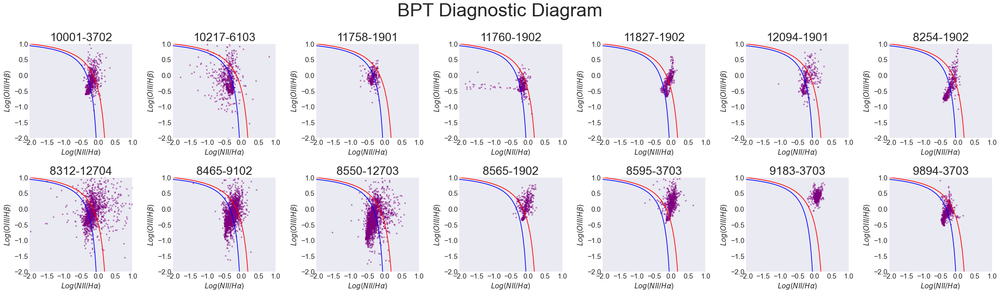

In [71]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['N2HA_RATIO']
    ydata = df['O3HB_RATIO']
    #yerr = df['D4000_ERR']

    # # split data in radial bins and 
    # bins = np.linspace(5, 9, 16)
    # digitized = np.digitize(xdata, bins)

    # # Calulates the median of each bin
    # xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    # ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    # ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    # #yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

    # # set xaxis for bin medians
    # #x = bins[:len(xdata_bin_meds)] + .2 # adjust for display offset


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    # BPT Plot
    # Plot kewley03 sf fit and Kauf01-sf+comp fit
    n2ha_sf_range = np.linspace(-2.0,0.045,int(1e4))
    n2ha_comp_range = np.linspace(-2.0,0.4,int(1e4))
    ka03_comp = (0.61 / (n2ha_sf_range - 0.05)) + 1.3
    ke01_sf = (0.61 / (n2ha_comp_range - 0.47)) + 1.19
    ax.plot(n2ha_sf_range, ke01_sf, color='blue')
    ax.plot(n2ha_comp_range, ka03_comp, color='red')
    ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='purple')
    # ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua')
    # ax.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua', linewidth='2')
    #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    #ax.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)
    ax.set_ylim(-2, 1)
    ax.set_xlim(-2, 1)
    ax.set_xlabel(r'$Log(NII/H{\alpha})$', fontsize=15)
    ax.set_ylabel(r'$Log(OIII/H{\beta})$', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)


    logm_list = np.arange(5.0, 11.0, 0.1)
    sfms_fit = 0.90 * logm_list - 9.57
    # ax.plot(logm_list, sfms_fit, color='red', label='Renzini & Peng 2015')
    # ax.plot(logm_list, sfms_fit-0.9, color='purple', label='Min density Bluck 2020', linestyle='--')
    # ax.legend(fontsize='10')
    # ax.legend(["Reff={}".format(reff)])
    #ax.axhline(1.4, color='black')

plt.suptitle('BPT Diagnostic Diagram', fontsize=40)  
plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_bpt_diagram.jpeg") # not displaying colorbar
plt.show()

# BBRD radial profiles

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/9894-3703_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning:

Mean of empty slice


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10001-3702_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10217-6103_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning

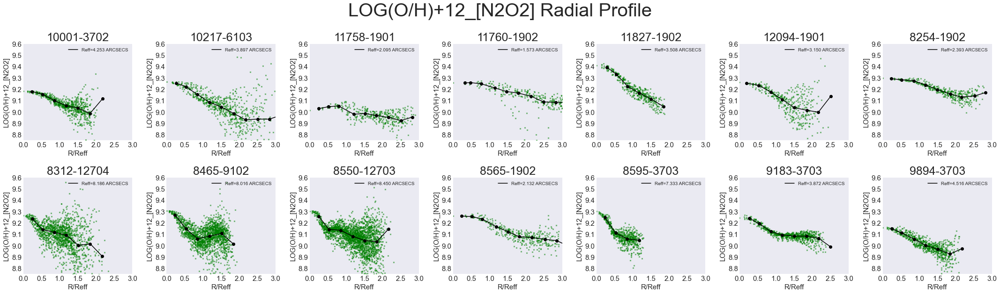

In [72]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['LOG(O/H)+12_[N2O2]']
    #yerr = df['D4000_ERR']

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

    # set xaxis for bin medians
    x = bins[:len(xdata_bin_meds)] + .2 # adjust for display offset


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='green')
    ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='black')
    ax.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='black')
    #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    #ax.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)
    ax.set_ylim(8.75, 9.6)
    ax.set_xlim(0, 3)
    ax.set_xlabel('R/Reff', fontsize=15)
    ax.set_ylabel('LOG(O/H)+12_[N2O2]', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    ax.legend(["Reff={}".format(reff)])
    #ax.axhline(1.4, color='black')

plt.suptitle('LOG(O/H)+12_[N2O2] Radial Profile', fontsize=40)  
plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_metaln2o2_radpro.jpeg") # not displaying colorbar
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/9894-3703_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10001-3702_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10217-6103_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/11758-1901_MM.fits' mode='rb' closefd=True>


[WARNING]: /U

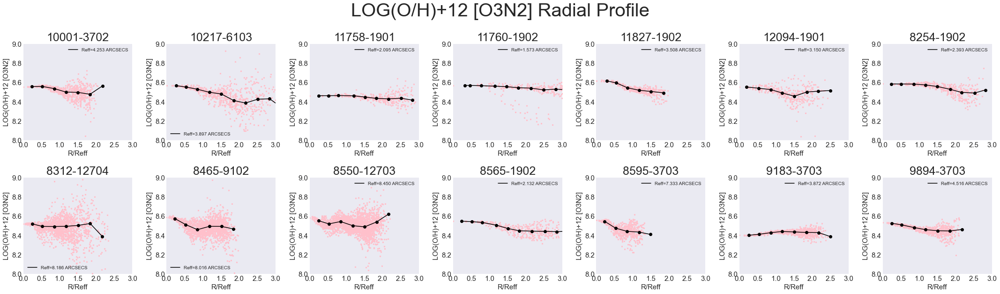

In [73]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['LOG(O/H)+12_[O3N2]']
    #yerr = df['D4000_ERR']

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

    # set xaxis for bin medians
    x = bins[:len(xdata_bin_meds)] + .2 # adjust for display offset


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    ax.scatter(xdata, ydata, s=6, marker='x', alpha=1.0, color='pink')
    ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='black')
    ax.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='black')
    #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    #ax.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)
    ax.set_ylim(8, 9.0)
    ax.set_xlim(0, 3)
    ax.set_xlabel('R/Reff', fontsize=15)
    ax.set_ylabel('LOG(O/H)+12 [O3N2]', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    ax.legend(["Reff={}".format(reff)])
    #ax.axhline(1.4, color='black')

plt.suptitle('LOG(O/H)+12 [O3N2] Radial Profile', fontsize=40)  
plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_metalo3n2_radpro.jpeg") # not displaying colorbar
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/9894-3703_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10001-3702_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10217-6103_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/11758-1901_MM.fits' mode='rb' closefd=True>


[WARNING]: /U

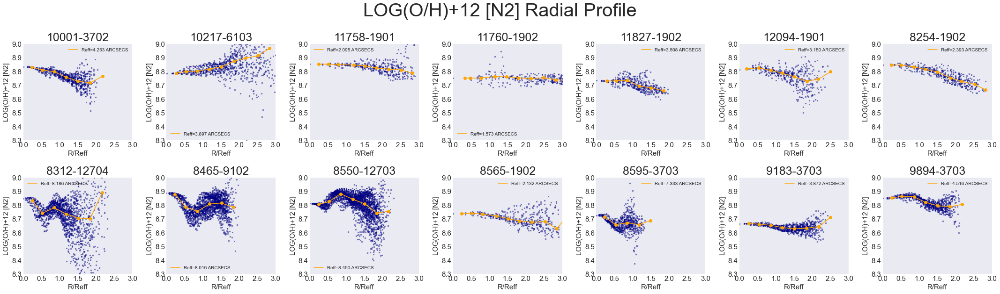

In [74]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['LOG(O/H)+12_[N2]']
    #yerr = df['D4000_ERR']

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

    # set xaxis for bin medians
    #x = bins[:len(xdata_bin_meds)] + .2 # adjust for display offset


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='navy')
    ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='orange')
    ax.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='orange')
    #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    #ax.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)
    ax.set_ylim(8.3, 9.0)
    ax.set_xlim(0, 3)
    ax.set_xlabel('R/Reff', fontsize=15)
    ax.set_ylabel('LOG(O/H)+12 [N2]', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    ax.legend(["Reff={}".format(reff)])
    #ax.axhline(1.4, color='black')

plt.suptitle('LOG(O/H)+12 [N2] Radial Profile', fontsize=40)  
plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_metaln2_radpro.jpeg") # not displaying colorbar
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/9894-3703_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10001-3702_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10217-6103_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/11758-1901_MM.fits' mode='rb' closefd=True>


[WARNING]: /U

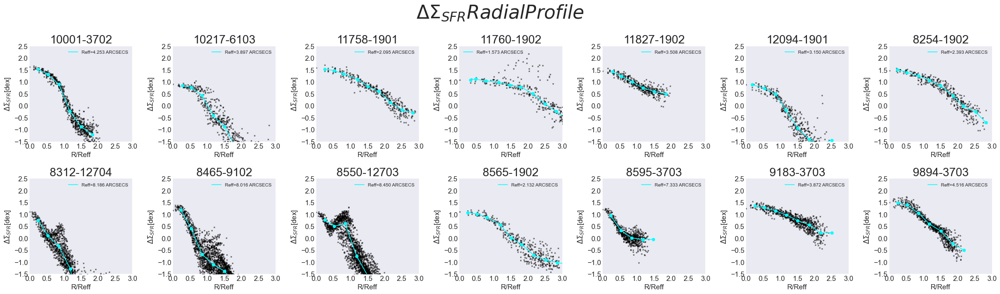

In [75]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['B20_DELTASFR']
    #yerr = df['D4000_ERR']

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

    # set xaxis for bin medians
    #x = bins[:len(xdata_bin_meds)] + .2 # adjust for display offset


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='black')
    ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua')
    ax.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua')
    #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    #ax.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)
    ax.set_ylim(-1.5, 2.5)
    ax.set_xlim(0, 3)
    ax.set_xlabel('R/Reff', fontsize=15)
    ax.set_ylabel('$\Delta\Sigma_{SFR}$[dex]', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    ax.legend(["Reff={}".format(reff)])
    #ax.axhline(1.4, color='black')

plt.suptitle('$\Delta\Sigma_{SFR} Radial Profile$', fontsize=40)  
plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_deltaSFR_radpro.jpeg") # not displaying colorbar
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:12: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/9894-3703_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:12: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10001-3702_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:12: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10217-6103_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:12: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/11758-1901_MM.fits' mode='rb' closefd=True>


[WARNING]: /U

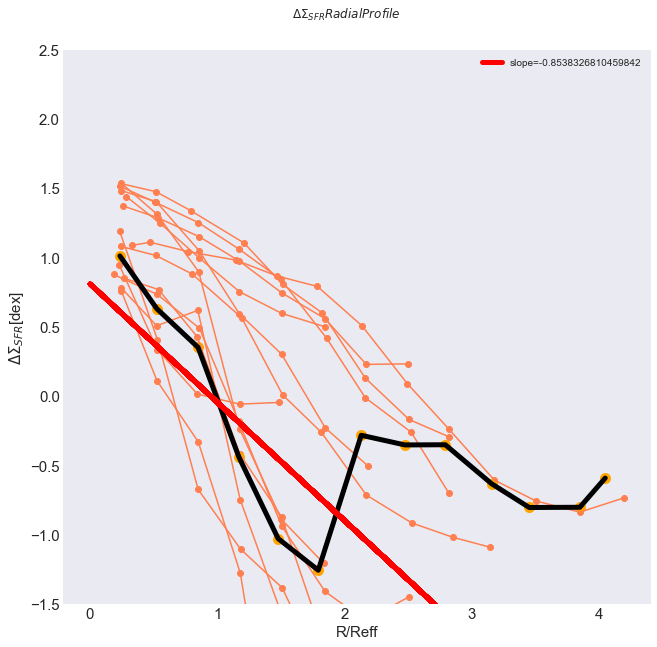

In [76]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")



# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(9,9), constrained_layout=True)

#plts = [plt0,plt1,plt2,plt3,plt4,plt5,plt6,plt7,plt8,plt9,plt10,plt11,plt12,plt13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['R/REFF']
    ydata = df['B20_DELTASFR']
    #yerr = df['D4000_ERR']

    # split data in radial bins and 
    bins = np.linspace(0, 5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

    # set xpltis for bin medians
    #x = bins[:len(xdata_bin_meds)] + .2 # adjust for display offset


    # Plotting
    #plt.scatter(xdata, ydata, s=6, marker='x', alpha=0.5)
    plt.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='coral')
    plt.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='coral')
    # plt = fig.add_subplot(2,7,int(num))
    # plt.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='black')
    # plt.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua')
    # plt.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua')
    # #plt.plot(x, agel_bin_meds, alpha=1.0, color='black')
    # #plt.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    # #plt.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)

    # plt.title('{}'.format(plateifu), fontsize=25)

    # plt.legend(["Reff={}".format(reff)])
    # #plt.plthline(1.4, color='black')

bbrd_csv_combo = "/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_combo.csv"
df = pd.read_csv(bbrd_csv_combo)
df.dropna(axis=0,how='any', inplace=True)
xdata = df['R/REFF']
ydata = df['B20_DELTASFR']
# split data in radial bins and 
bins = np.linspace(0, 5, 16)
digitized = np.digitize(xdata, bins)
# Calulates the median of each bin
xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]

#plt.scatter(xdata, ydata, color='blue', marker='x')
plt.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='orange', linewidth=5)
plt.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='black', linewidth=5)

# least square polynomial fit
# xdata.dropna(inplace=True)
# ydata.dropna(inplace=True)
# coef = np.polyfit(xdata, ydata, 3)
# polyfit_fn = np.poly1d(coef)
m, b = np.polyfit(xdata, ydata, 1)
ydata_fit = (m * xdata) + b

#plt.plot(xdata, ydata, color='black')
# plt.plot(np.sort(xdata), np.sort(polyfit_fn(ydata)), color='red')
plt.plot(xdata, ydata_fit, color='red', label='slope={}'.format(m), linewidth=5)
plt.suptitle('$\Delta\Sigma_{SFR} Radial Profile$', fontsize=12)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15) 
plt.tight_layout(pad=2)
plt.ylim(-1.5, 2.5)
# plt.xlim(-0.5, 6)
plt.xlabel('R/Reff', fontsize=15)
plt.ylabel('$\Delta\Sigma_{SFR}$[dex]', fontsize=15)
plt.legend()
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_deltaSFR_combo_radpro.jpeg") # not displaying colorbar
plt.show()

# Mass-Metallicity Relation plots for BBRD sample

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/9894-3703_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10001-3702_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10217-6103_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning:

Mean of empty slice


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning

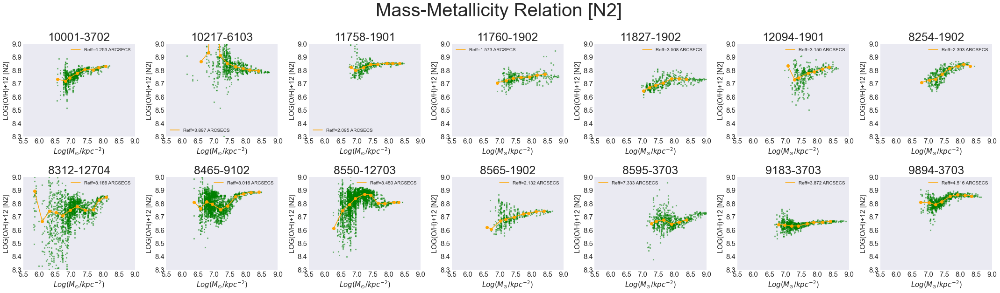

In [77]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['MSUN/SPX2']
    ydata = df['LOG(O/H)+12_[N2]']
    #yerr = df['D4000_ERR']

    # split data in radial bins and 
    bins = np.linspace(5, 8.5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

    # set xaxis for bin medians
    #x = bins[:len(xdata_bin_meds)] + .2 # adjust for display offset


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='green')
    ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='orange')
    ax.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='orange')
    #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    #ax.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)
    ax.set_ylim(8.3, 9.0)
    ax.set_xlim(5.5, 9)
    ax.set_xlabel(r'$Log(M_{\odot}/kpc^{-2})$', fontsize=15)
    ax.set_ylabel('LOG(O/H)+12 [N2]', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    ax.legend(["Reff={}".format(reff)])
    #ax.axhline(1.4, color='black')

plt.suptitle('Mass-Metallicity Relation [N2]', fontsize=40)  
plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_MZRn2_radpro.jpeg") # not displaying colorbar
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/9894-3703_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10001-3702_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10217-6103_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/11758-1901_MM.fits' mode='rb' closefd=True>


[WARNING]: /U

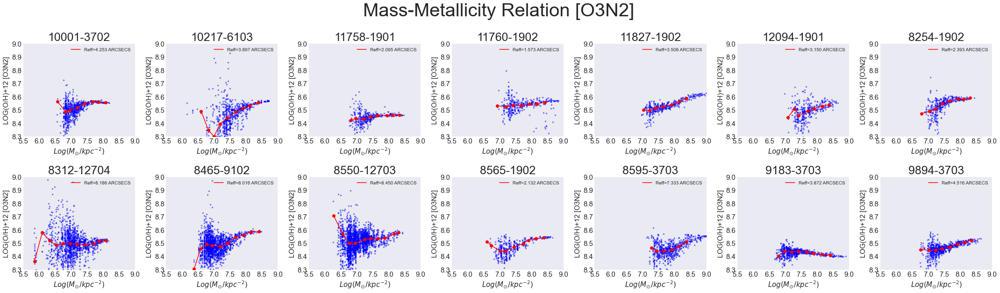

In [78]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['MSUN/SPX2']
    ydata = df['LOG(O/H)+12_[O3N2]']
    #yerr = df['D4000_ERR']

    # split data in radial bins and 
    bins = np.linspace(5, 8.5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

    # set xaxis for bin medians
    #x = bins[:len(xdata_bin_meds)] + .2 # adjust for display offset


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='blue')
    ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='red')
    ax.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='red')
    #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    #ax.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)
    ax.set_ylim(8.3, 9.0)
    ax.set_xlim(5.5, 9)
    ax.set_xlabel(r'$Log(M_{\odot}/kpc^{-2})$', fontsize=15)
    ax.set_ylabel('LOG(O/H)+12 [O3N2]', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    ax.legend(["Reff={}".format(reff)])
    #ax.axhline(1.4, color='black')

plt.suptitle('Mass-Metallicity Relation [O3N2]', fontsize=40)  
plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_MZRo3n2_radpro.jpeg") # not displaying colorbar
plt.show()

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/9894-3703_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10001-3702_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/10217-6103_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/11758-1901_MM.fits' mode='rb' closefd=True>


[WARNING]: /U

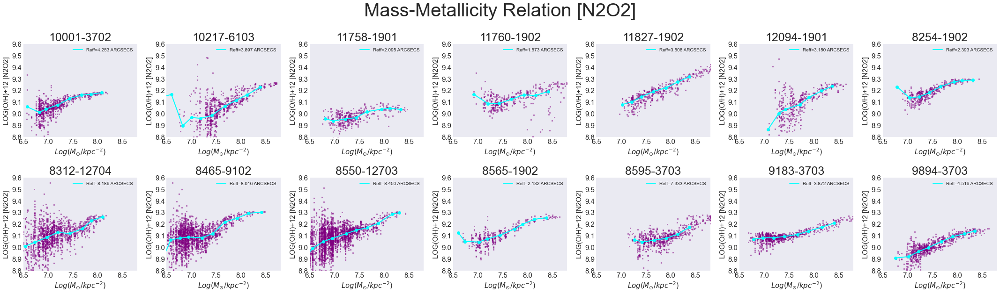

In [79]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['MSUN/SPX2']
    ydata = df['LOG(O/H)+12_[N2O2]']
    #yerr = df['D4000_ERR']

    # split data in radial bins and 
    bins = np.linspace(5, 8.5, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

    # set xaxis for bin medians
    #x = bins[:len(xdata_bin_meds)] + .2 # adjust for display offset


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='purple')
    ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua')
    ax.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua', linewidth='2')
    #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    #ax.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)
    ax.set_ylim(8.8, 9.6)
    ax.set_xlim(6.5, 8.8)
    ax.set_xlabel(r'$Log(M_{\odot}/kpc^{-2})$', fontsize=15)
    ax.set_ylabel('LOG(O/H)+12 [N2O2]', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    ax.legend(["Reff={}".format(reff)])
    #ax.axhline(1.4, color='black')

plt.suptitle('Mass-Metallicity Relation [N2O2]', fontsize=40)  
plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_MZRn2o2_radpro.jpeg") # not displaying colorbar
plt.show()

# Star-Forming Main Sequence

[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/ipykernel_launcher.py:10: ResourceWarning:

unclosed file <_io.FileIO name='/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/9894-3703_MM.fits' mode='rb' closefd=True>


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning:

Mean of empty slice


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning:

Mean of empty slice


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning:

Mean of empty slice


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning:

Mean of empty slice


[WARNING]: /Users/mmckay/conda/envs/marvin_v2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning:

Mean of empty slice


[WARNING]: /Users/mmckay/cond

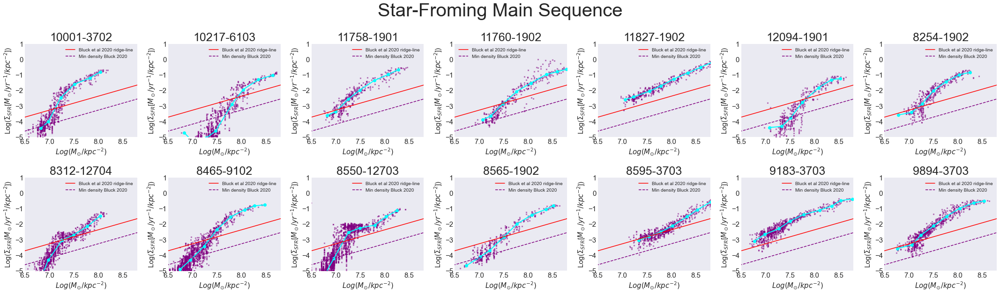

In [80]:
bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=True)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    # Read in CSV data
    df = pd.read_csv(bbrd_csv)
    xdata = df['MSUN/SPX2']
    ydata = df['LOGSFR DENSITY']
    #yerr = df['D4000_ERR']

    # split data in radial bins and 
    bins = np.linspace(5, 9, 16)
    digitized = np.digitize(xdata, bins)

    # Calulates the median of each bin
    xdata_bin_meds = [xdata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_meds = [ydata[digitized == i].median() for i in range(1, len(bins))]
    ydata_bin_stds = [ydata[digitized == i].std() for i in range(1, len(bins))]
    #yerr_bin_meds = [yerr[digitized == i].median() for i in range(1, len(bins))]

    # set xaxis for bin medians
    #x = bins[:len(xdata_bin_meds)] + .2 # adjust for display offset


    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    ax.scatter(xdata, ydata, s=6, marker='x', alpha=0.5, color='purple')
    ax.scatter(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua')
    ax.plot(xdata_bin_meds, ydata_bin_meds, alpha=1.0, color='aqua', linewidth='2')
    #ax.plot(x, agel_bin_meds, alpha=1.0, color='black')
    #ax.errorbar(x, agel_bin_meds, yerr=1/(np.array(agel_bin_stds)**2), color='cyan')
    #ax.errorbar(x, ydata_bin_meds, yerr=yerr_bin_meds, color='black', linestyle='--', capsize=3, linewidth=3.0)
    ax.set_ylim(-5, 1)
    ax.set_xlim(6.5, 8.8)
    ax.set_xlabel(r'$Log(M_{\odot}/kpc^{-2})$', fontsize=15)
    ax.set_ylabel(r'Log($\Sigma_{SFR}$[$M_\odot/yr^{-1}/kpc^{-2}$])', fontsize=15)
    ax.set_title('{}'.format(plateifu), fontsize=25)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)


    logm_list = np.arange(5.0, 11.0, 0.1)
    sfms_fit = 0.90 * logm_list - 9.57
    ax.plot(logm_list, sfms_fit, color='red', label='Bluck et al 2020 ridge-line')
    ax.plot(logm_list, sfms_fit-0.9, color='purple', label='Min density Bluck 2020', linestyle='--')
    ax.legend(fontsize='10')
    # ax.legend(["Reff={}".format(reff)])
    # ax.axhline(1.4, color='black')
    hdu.close()

plt.suptitle('Star-Froming Main Sequence', fontsize=40)  
plt.tight_layout(pad=2)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_sfms.jpeg") # not displaying colorbar
plt.show()

In [24]:
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")
# bbrd_csv_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.csv")

# Plot Mosaic of BBRD sample D4000 Maps from Pipe3D
fig = plt.figure(figsize=(30,9), constrained_layout=False, dpi=300)

#axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
for bbrd_fits, bbrd_csv, num in zip(np.sort(bbrd_fits_file_list), np.sort(bbrd_csv_file_list), np.linspace(1,14,14)):
    # Read in FITS data
    hdu = fits.open(bbrd_fits)
    #print(int(num), bbrd_fits, bbrd_csv)
    # ageL_map = hdu['GYR_LW'].data
    # ageL_err_map = hdu['GYR_ERR'].data
    # r_reff_map = hdu['R/Reff'].data
    # # ellip_r_map = hdu['ELLIP R'].data
    plateifu = hdu[0].header['plateifu']
    reff = hdu[0].header['REFF']

    hdu.close()
    imfn = '/Users/mmckay/Desktop/research/FMR_MZR/bbrd_sdss_images/{}.png'.format(plateifu)
    #imfn = im.filename
    #print(imfn)
    img = mpimg.imread(imfn)



    # Plotting
    ax = fig.add_subplot(2,7,int(num))
    imgplot = ax.imshow(img, aspect=1, label='{}'.format(plateifu))
    ax.set_title('{}'.format(plateifu), fontsize=35)
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
    # ax.legend()
    # plt.xticks(fontsize=15)
    # plt.yticks(fontsize=15)


    # logm_list = np.arange(5.0, 11.0, 0.1)
    # sfms_fit = 0.90 * logm_list - 9.57
    # ax.plot(logm_list, sfms_fit, color='red', label='Renzini & Peng 2015')
    # ax.plot(logm_list, sfms_fit-0.9, color='purple', label='Min density Bluck 2020', linestyle='--')
    # ax.legend(fontsize='10')
    # ax.legend(["Reff={}".format(reff)])
    #ax.axhline(1.4, color='black')

# plt.suptitle('SDSS Color Images', fontsize=40)  
plt.tight_layout(h_pad=2.5, w_pad=-5.0)
plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_sdssimgs.jpeg") # not displaying colorbar
# plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_sdssimgs.pdf")
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/Users/mmckay/Desktop/research/FMR_MZR/bbrd_sdss_images/10001-3702.png'

<Figure size 9000x2700 with 0 Axes>

# Integrated measurements form Pipe3D plots of BBRD sample

0.0 10001-3702 10.214129582329301
1.0 10217-6103 10.7282109225841
2.0 11760-1902 10.6325232689909
3.0 11827-1902 10.7047587686776
4.0 12094-1901 10.5327450519931
5.0 8254-1902 10.291372301435803
6.0 8312-12704 10.5182471202357
7.0 8465-9102 10.521694623668699
8.0 8550-12703 10.634748474198
9.0 8565-1902 10.3140534494069
10.0 8595-3703 10.9762615520585
11.0 9183-3703 10.6199796592799
12.0 9894-3703 10.610798819668801


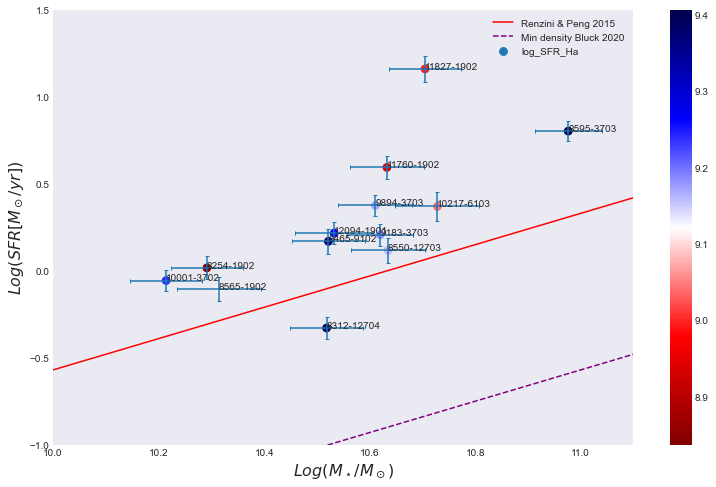

In [82]:
pipe3d_intergraded_df = pd.read_csv('/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/intergrated_measure_pipe3D.csv')
pipe3d_intergraded_df

plt.figure(figsize=(13,8))
plt.scatter(pipe3d_intergraded_df['log_Mass'], pipe3d_intergraded_df['log_SFR_Ha'], label='log_SFR_Ha', c=pipe3d_intergraded_df['Age_LW_Re_fit'], cmap='seismic_r', s=60)
plt.errorbar(pipe3d_intergraded_df['log_Mass'], pipe3d_intergraded_df['log_SFR_Ha'], yerr=pipe3d_intergraded_df['e_log_SFR_Ha'], xerr=pipe3d_intergraded_df['e_log_Mass'], ls='none', capsize=2)

plt.colorbar()
#plt.scatter(pipe3d_intergraded_df['log_Mass'], pipe3d_intergraded_df['log_SFR_ssp'], color='orange', label='log_SFR_ssp')

for i , plateifu, mass in zip(np.linspace(0,13,14),pipe3d_intergraded_df['plateifu'], pipe3d_intergraded_df['log_Mass']):
    print(i, plateifu, mass)
    plt.annotate(plateifu, (pipe3d_intergraded_df['log_Mass'][i], pipe3d_intergraded_df['log_SFR_Ha'][i]))

logm_list = np.arange(5.0, 12.0, 0.1)
sfms_fit = 0.90 * logm_list - 9.57
plt.plot(logm_list, sfms_fit, color='red', label='Renzini & Peng 2015')
plt.plot(logm_list, sfms_fit-0.9, color='purple', label='Min density Bluck 2020', linestyle='--')
plt.legend(fontsize='10')
plt.xlabel(r'$Log(M_\star/M_\odot)$', fontsize=16)
plt.ylabel(r'$Log(SFR[M_\odot / yr])$', fontsize=16)
plt.xlim(10, 11.1)
plt.ylim(-1,1.5)

plt.savefig('/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/sfms_intergrated_values.jpeg')

In [83]:
np.linspace(0,14,15)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14.])

# ----------------------------------------

In [84]:
# bbrd_fits_file_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/*.fits")

# # Plot Mosaic of BBRD sample
# fig = plt.figure(figsize=(30,9), constrained_layout=True)

# #axs = [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13]
# for bbrd_fits, num in zip(np.sort(bbrd_fits_file_list), np.linspace(1,14,14)):
#     hdu = fits.open(bbrd_fits)
#     #print(int(num), bbrd_fits)
#     map_2d = np.log10(1 / (hdu['HALPHA ERROR'].data**2))
#     r_reff_map = hdu['R/Reff'].data
#     ellip_r_map = hdu['ELLIP R'].data
#     plateifu = hdu[0].header['plateifu']
#     reff = hdu[0].header['REFF']
#     hdu.close()

#     ax = fig.add_subplot(2,7,int(num))
#     im = ax.imshow(map_2d, origin='lower', cmap='magma')
#     ellip_r_contour = ax.contour(ellip_r_map, levels = np.arange(1, 3, 1), origin='lower', colors='g',
#     linewidths=5)
#     r_reff_contour = ax.contour(r_reff_map, levels = np.arange(1, 2, 1), origin='lower', colors='c',
#     linewidths=5)
#     #ax.clabel(r_reff_contour, fontsize=9, inline=1)
#     ax.set_title('{}'.format(plateifu), fontsize=25)
#     plt.xticks(fontsize=20)
#     plt.yticks(fontsize=20)
#     ax.legend(["Reff={}".format(reff)])
    


# cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
# cbar = fig.colorbar(im, ax=ax, cax=cbaxes, aspect=5.3, orientation='vertical', extend='both')
# cbar.ax.tick_params(labelsize=25)
# cbar.set_label(label=r'$\Delta\Sigma_{SFR}$[dex]', size='large', fontsize=25)
# plt.tight_layout()
# #plt.savefig("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/bbrd_DeltaSFR_mosaic.jpeg", bbox_inches='tight') # not displaying colorbar
# plt.show()

In [85]:
# This code is used to Download MaNGA DAP maps from MPL-11
# 1. Dowmload data from https://data.sdss.org/sas/mangawork/manga/spectro/analysis/MPL-11/HYB10-MILESHC-MASTARSSP/ to a harddrive
# 2. Extract needed data to new FITS file -> see if I can edit a function or 2 in gererate fits notebook
# 3. Push code to Git for how to rememmber to download data from MPL-11


In [86]:
# file_path = '/Volumes/lil_oynx/bbrd_dapfits/manga-8254-1902-MAPS-HYB10-MILESHC-MASTARSSP.fits'
# hdu = fits.open(file_path)
# hdu.info()

In [87]:
# hdu[0].header['*']

In [88]:
# file_path = '/Volumes/lil_onyx/bbrd_Pipe3Dfits/manga-10001-3702.Pipe3D.cube.fits'
# hdu = fits.open(file_path)

# hdu.info()

In [89]:
# file_path = '/Volumes/lil_onyx/bbrd_Pipe3Dfits/manga-8254-1902.Pipe3D.cube.fits'
# hdu = fits.open(file_path)

# hdu.info()

In [90]:
# hdu[1].header['*']

In [91]:
# ha_elflux_map1 = hdu[23].data[24]
# ha_elflux_map2 = hdu[30].data[24]

In [92]:


#px.imshow(np.log10(ha_elflux_map1))

In [93]:
# px.imshow(np.log10(ha_elflux_map2))

In [94]:


bbrd_df = pd.read_csv('/Users/mmckay/Desktop/research/FMR_MZR/final_MaNGAdr16_bbrd_crossmatch.csv')
bbrd_df.count()

Unnamed: 0                 14
Objra                      14
Objdec                     14
mangaid                    14
plateifu                   14
nsa_z                      14
SDSS_RA_deg                14
SDSS_DEC_deg               14
SDSS_z                     14
DR16_match_sep2d_deg       14
DR16_match_sep2d_arcsec    14
dtype: int64

In [95]:
lg12_df = pd.read_csv('/Users/mmckay/Desktop/research/FMR_MZR/final_MaNGAdr16_lg12_crossmatch.csv')
lg12_df.count()

Unnamed: 0                 268
Objra                      268
Objdec                     268
mangaid                    268
plateifu                   268
nsa_z                      268
SDSS_RA_deg                268
SDSS_DEC_deg               268
SDSS_z                     268
DR16_match_sep2d_deg       268
DR16_match_sep2d_arcsec    268
dtype: int64

In [96]:
for i,j in zip(bbrd_df['nsa_z'][], bbrd_df['plateifu']):
    print(i,j)

SyntaxError: invalid syntax (<ipython-input-96-312bf733defe>, line 1)

In [ ]:
dap_gal_fits = fits.open("/Volumes/lil_oynx/bbrd_dapfits/manga-{}-MAPS-HYB10-MILESHC-MASTARSSP.fits".format('10001-3702'))